![](img/image.png)




# Прогнозирование направления изменения курса доллара США в российских рублях (USD/RUB) на один день вперед
## Исследование №2 с использованием временных рядов

Исходные данные: курс валютной пары USD/RUB, индекс ММВБ и индекс S&P500 (дневные данные).

### Гипотеза
Изменение цен индексов за вчерашний день и движение цены доллара США за прошедшие периоды содержат в себе информацию о будущем изменении курса USD/RUB.

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

Посмотрим на данные.

In [2]:
usdrub = pd.read_csv('USDRUB_TOM.txt')
usdrub

,<TICKER>,<PER>,<DATE>,<TIME>,<OPEN>,<HIGH>,<LOW>,<CLOSE>,<VOL>
0,USD000UTSTOM [CETS],Daily,20030415,0,31.1850,31.1975,31.1850,31.1970,36311.0
1,USD000UTSTOM [CETS],Daily,20030416,0,31.1950,31.1950,31.1850,31.1885,23372.0
2,USD000UTSTOM [CETS],Daily,20030417,0,31.1800,31.2000,31.1700,31.1975,60261.0
3,USD000UTSTOM [CETS],Daily,20030418,0,31.1975,31.1975,31.1800,31.1801,33785.0
4,USD000UTSTOM [CETS],Daily,20030421,0,31.1065,31.1100,31.1000,31.1025,16609.0
...,...,...,...,...,...,...,...,...,...
3794,USD000UTSTOM [CETS],Daily,20210506,0,74.8400,74.9000,74.2000,74.2300,2187468.0
3795,USD000UTSTOM [CETS],Daily,20210507,0,73.9625,74.5500,72.0025,73.7850,2764362.0
3796,USD000UTSTOM [CETS],Daily,20210510,0,73.7850,74.3575,73.5125,74.3500,1031307.0
3797,USD000UTSTOM [CETS],Daily,20210511,0,74.3050,74.4250,73.8200,74.1100,2343062.0


Переименуем признаки.

In [3]:
usdrub.columns = ['TICKER', 'PER', 'DATE', 'TIME', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'CLOSE_cur', 'VOL_cur']
usdrub

,TICKER,PER,DATE,TIME,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur
0,USD000UTSTOM [CETS],Daily,20030415,0,31.1850,31.1975,31.1850,31.1970,36311.0
1,USD000UTSTOM [CETS],Daily,20030416,0,31.1950,31.1950,31.1850,31.1885,23372.0
2,USD000UTSTOM [CETS],Daily,20030417,0,31.1800,31.2000,31.1700,31.1975,60261.0
3,USD000UTSTOM [CETS],Daily,20030418,0,31.1975,31.1975,31.1800,31.1801,33785.0
4,USD000UTSTOM [CETS],Daily,20030421,0,31.1065,31.1100,31.1000,31.1025,16609.0
...,...,...,...,...,...,...,...,...,...
3794,USD000UTSTOM [CETS],Daily,20210506,0,74.8400,74.9000,74.2000,74.2300,2187468.0
3795,USD000UTSTOM [CETS],Daily,20210507,0,73.9625,74.5500,72.0025,73.7850,2764362.0
3796,USD000UTSTOM [CETS],Daily,20210510,0,73.7850,74.3575,73.5125,74.3500,1031307.0
3797,USD000UTSTOM [CETS],Daily,20210511,0,74.3050,74.4250,73.8200,74.1100,2343062.0


Убираем лишнее.

In [4]:
usdrub = usdrub.drop(['TICKER', 'PER', 'TIME'], axis=1)
usdrub

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur
0,20030415,31.1850,31.1975,31.1850,31.1970,36311.0
1,20030416,31.1950,31.1950,31.1850,31.1885,23372.0
2,20030417,31.1800,31.2000,31.1700,31.1975,60261.0
3,20030418,31.1975,31.1975,31.1800,31.1801,33785.0
4,20030421,31.1065,31.1100,31.1000,31.1025,16609.0
...,...,...,...,...,...,...
3794,20210506,74.8400,74.9000,74.2000,74.2300,2187468.0
3795,20210507,73.9625,74.5500,72.0025,73.7850,2764362.0
3796,20210510,73.7850,74.3575,73.5125,74.3500,1031307.0
3797,20210511,74.3050,74.4250,73.8200,74.1100,2343062.0


Переводим признак с датой во временной формат.

In [5]:
usdrub['DATE'] = pd.to_datetime(usdrub['DATE'], format='%Y%m%d')
usdrub

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur
0,2003-04-15,31.1850,31.1975,31.1850,31.1970,36311.0
1,2003-04-16,31.1950,31.1950,31.1850,31.1885,23372.0
2,2003-04-17,31.1800,31.2000,31.1700,31.1975,60261.0
3,2003-04-18,31.1975,31.1975,31.1800,31.1801,33785.0
4,2003-04-21,31.1065,31.1100,31.1000,31.1025,16609.0
...,...,...,...,...,...,...
3794,2021-05-06,74.8400,74.9000,74.2000,74.2300,2187468.0
3795,2021-05-07,73.9625,74.5500,72.0025,73.7850,2764362.0
3796,2021-05-10,73.7850,74.3575,73.5125,74.3500,1031307.0
3797,2021-05-11,74.3050,74.4250,73.8200,74.1100,2343062.0


In [6]:
usdrub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3799 entries, 0 to 3798
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   DATE       3799 non-null   datetime64[ns]
 1   OPEN_cur   3799 non-null   float64       
 2   HIGH_cur   3799 non-null   float64       
 3   LOW_cur    3799 non-null   float64       
 4   CLOSE_cur  3799 non-null   float64       
 5   VOL_cur    3799 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 178.2 KB


Убираем совсем старые данные, руководствуясь предположением, что структура и участники рынка изменились после 2014 года.

In [7]:
usdrub = usdrub[(usdrub.DATE > '2015-10-01')]
usdrub

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur
2386,2015-10-02,65.8060,66.6890,65.6290,66.012,4314450.0
2387,2015-10-05,65.7740,65.9720,64.5450,64.749,4643788.0
2388,2015-10-06,64.7200,65.2710,63.3300,63.330,5291802.0
2389,2015-10-07,63.0700,63.2900,61.8540,62.664,7069508.0
2390,2015-10-08,62.5230,62.7110,61.2800,61.370,5207659.0
...,...,...,...,...,...,...
3794,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0
3795,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0
3796,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0
3797,2021-05-11,74.3050,74.4250,73.8200,74.110,2343062.0


Добавляем дополнительные признаки: движение цены между открытием и закрытием дневной торговой сессии и диапазон цены за этот день. 

In [8]:
def currency_movement(row):
    return row['CLOSE_cur'] - row['OPEN_cur']

def currency_spread(row):
    return row['HIGH_cur'] - row['LOW_cur']

In [9]:
usdrub['Cur_movement'] = usdrub.apply(currency_movement, axis=1)
usdrub['Cur_spread'] = usdrub.apply(currency_spread, axis=1)

usdrub

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur,Cur_movement,Cur_spread
2386,2015-10-02,65.8060,66.6890,65.6290,66.012,4314450.0,0.2060,1.0600
2387,2015-10-05,65.7740,65.9720,64.5450,64.749,4643788.0,-1.0250,1.4270
2388,2015-10-06,64.7200,65.2710,63.3300,63.330,5291802.0,-1.3900,1.9410
2389,2015-10-07,63.0700,63.2900,61.8540,62.664,7069508.0,-0.4060,1.4360
2390,2015-10-08,62.5230,62.7110,61.2800,61.370,5207659.0,-1.1530,1.4310
...,...,...,...,...,...,...,...,...
3794,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0,-0.6100,0.7000
3795,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0,-0.1775,2.5475
3796,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0,0.5650,0.8450
3797,2021-05-11,74.3050,74.4250,73.8200,74.110,2343062.0,-0.1950,0.6050


Добавляем в построчно данные о цене из прошлых периодов.

In [10]:
usdrub_close = usdrub.filter(items = ['DATE', 'CLOSE_cur'])
usdrub_close

,DATE,CLOSE_cur
2386,2015-10-02,66.012
2387,2015-10-05,64.749
2388,2015-10-06,63.330
2389,2015-10-07,62.664
2390,2015-10-08,61.370
...,...,...
3794,2021-05-06,74.230
3795,2021-05-07,73.785
3796,2021-05-10,74.350
3797,2021-05-11,74.110


In [11]:
# Adding the lag of the target variable from 1 steps back up to 11
for i in range(1, 11):
    usdrub_close["lag_{}".format(i)] = usdrub_close.CLOSE_cur.shift(i)

In [12]:
usdrub_close

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10
2386,2015-10-02,66.012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2387,2015-10-05,64.749,66.012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2388,2015-10-06,63.330,64.749,66.0120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2389,2015-10-07,62.664,63.330,64.7490,66.0120,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2390,2015-10-08,61.370,62.664,63.3300,64.7490,66.0120,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
3794,2021-05-06,74.230,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000
3795,2021-05-07,73.785,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175
3796,2021-05-10,74.350,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800
3797,2021-05-11,74.110,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700


Добавляем дополнительные признаки из существующих данных при помощи библиотеки tsfresh.

In [13]:
from tsfresh import extract_features, extract_relevant_features, select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh.feature_extraction import settings

In [14]:
usdrub_close = usdrub_close[(usdrub_close.DATE > '2015-10-15')]
usdrub_close

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10
2396,2015-10-16,61.285,61.403,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,66.0120
2397,2015-10-19,62.262,61.285,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490
2398,2015-10-20,62.115,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300
2399,2015-10-21,63.005,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640
2400,2015-10-22,62.591,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700
...,...,...,...,...,...,...,...,...,...,...,...,...
3794,2021-05-06,74.230,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000
3795,2021-05-07,73.785,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175
3796,2021-05-10,74.350,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800
3797,2021-05-11,74.110,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700


In [15]:
import numpy as np

In [16]:
usdrub_close_drop_close = usdrub_close.drop(['CLOSE_cur', 'DATE'], axis = 1)
usdrub_close_drop_close

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10
2396,61.403,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,66.0120
2397,61.285,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490
2398,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300
2399,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640
2400,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700
...,...,...,...,...,...,...,...,...,...,...
3794,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000
3795,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175
3796,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800
3797,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700


Подготавливаем данные для вычислений в tsfresh.

In [17]:
data_long = pd.DataFrame({0: usdrub_close_drop_close.values.flatten(),
                          1: np.arange(usdrub_close_drop_close.shape[0]).repeat(usdrub_close_drop_close.shape[1])})
print(data_long.shape)
data_long.head()

(14030, 2)


,0,1
0,61.403,0
1,62.709,0
2,63.039,0
3,62.275,0
4,61.876,0


In [18]:
data_long

,0,1
0,61.4030,0
1,62.7090,0
2,63.0390,0
3,62.2750,0
4,61.8760,0
...,...,...
14025,74.8425,1402
14026,75.2100,1402
14027,74.6350,1402
14028,74.4125,1402


Объявляем набор добавляемых признаков.

In [19]:
settings_minimal = settings.MinimalFCParameters()
settings_minimal

{'sum_values': None,
 'median': None,
 'mean': None,
 'length': None,
 'standard_deviation': None,
 'variance': None,
 'root_mean_square': None,
 'maximum': None,
 'minimum': None}

In [20]:
settings_time = settings.TimeBasedFCParameters()
settings_time.update(settings_minimal)
settings_time

{'linear_trend_timewise': [{'attr': 'pvalue'},
  {'attr': 'rvalue'},
  {'attr': 'intercept'},
  {'attr': 'slope'},
  {'attr': 'stderr'}],
 'sum_values': None,
 'median': None,
 'mean': None,
 'length': None,
 'standard_deviation': None,
 'variance': None,
 'root_mean_square': None,
 'maximum': None,
 'minimum': None}

Добавляем признаки.

In [21]:
X = extract_features(
    data_long, column_id=1, 
    impute_function=impute, 
    default_fc_parameters=settings_time,
    n_jobs=2
)
print(X.shape)
X 

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 10/10 [00:07<00:00,  1.32it/s]

(1403, 9)


,0__sum_values,0__median,0__mean,0__length,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum
0,629.4270,62.68650,62.94270,10.0,1.392933,1.940262,62.958111,66.0120,61.3700
1,624.7000,62.46950,62.47000,10.0,1.024477,1.049553,62.478400,64.7490,61.2850
2,622.2130,62.26850,62.22130,10.0,0.687491,0.472644,62.225098,63.3300,61.2850
3,620.9980,62.18850,62.09980,10.0,0.579733,0.336090,62.102506,63.0390,61.2850
4,621.3390,62.18850,62.13390,10.0,0.620511,0.385034,62.136998,63.0390,61.2850
...,...,...,...,...,...,...,...,...,...
1398,750.8175,74.93000,75.08175,10.0,0.569891,0.324776,75.083913,76.6000,74.4125
1399,748.4475,74.87500,74.84475,10.0,0.332636,0.110647,74.845489,75.4175,74.2300
1400,746.8150,74.85125,74.68150,10.0,0.404350,0.163499,74.682595,75.2100,73.7850
1401,746.1850,74.73875,74.61850,10.0,0.402006,0.161609,74.619583,75.2100,73.7850


In [22]:
X = X.drop(['0__length'], axis = 1)

In [23]:
X

,0__sum_values,0__median,0__mean,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum
0,629.4270,62.68650,62.94270,1.392933,1.940262,62.958111,66.0120,61.3700
1,624.7000,62.46950,62.47000,1.024477,1.049553,62.478400,64.7490,61.2850
2,622.2130,62.26850,62.22130,0.687491,0.472644,62.225098,63.3300,61.2850
3,620.9980,62.18850,62.09980,0.579733,0.336090,62.102506,63.0390,61.2850
4,621.3390,62.18850,62.13390,0.620511,0.385034,62.136998,63.0390,61.2850
...,...,...,...,...,...,...,...,...
1398,750.8175,74.93000,75.08175,0.569891,0.324776,75.083913,76.6000,74.4125
1399,748.4475,74.87500,74.84475,0.332636,0.110647,74.845489,75.4175,74.2300
1400,746.8150,74.85125,74.68150,0.404350,0.163499,74.682595,75.2100,73.7850
1401,746.1850,74.73875,74.61850,0.402006,0.161609,74.619583,75.2100,73.7850


In [24]:
usdrub_close.reset_index(drop=True, inplace=True)
usdrub_close

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10
0,2015-10-16,61.285,61.403,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,66.0120
1,2015-10-19,62.262,61.285,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490
2,2015-10-20,62.115,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300
3,2015-10-21,63.005,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640
4,2015-10-22,62.591,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700
...,...,...,...,...,...,...,...,...,...,...,...,...
1398,2021-05-06,74.230,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000
1399,2021-05-07,73.785,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175
1400,2021-05-10,74.350,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800
1401,2021-05-11,74.110,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700


Объединяем таблички.

In [25]:
usdrub_and_x = pd.concat([usdrub_close, X], axis=1)
usdrub_and_x

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,0__sum_values,0__median,0__mean,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum
0,2015-10-16,61.285,61.403,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,66.0120,629.4270,62.68650,62.94270,1.392933,1.940262,62.958111,66.0120,61.3700
1,2015-10-19,62.262,61.285,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,624.7000,62.46950,62.47000,1.024477,1.049553,62.478400,64.7490,61.2850
2,2015-10-20,62.115,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,622.2130,62.26850,62.22130,0.687491,0.472644,62.225098,63.3300,61.2850
3,2015-10-21,63.005,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,620.9980,62.18850,62.09980,0.579733,0.336090,62.102506,63.0390,61.2850
4,2015-10-22,62.591,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,621.3390,62.18850,62.13390,0.620511,0.385034,62.136998,63.0390,61.2850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1398,2021-05-06,74.230,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,750.8175,74.93000,75.08175,0.569891,0.324776,75.083913,76.6000,74.4125
1399,2021-05-07,73.785,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,748.4475,74.87500,74.84475,0.332636,0.110647,74.845489,75.4175,74.2300
1400,2021-05-10,74.350,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,746.8150,74.85125,74.68150,0.404350,0.163499,74.682595,75.2100,73.7850
1401,2021-05-11,74.110,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,746.1850,74.73875,74.61850,0.402006,0.161609,74.619583,75.2100,73.7850


In [26]:
usdrub

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur,Cur_movement,Cur_spread
2386,2015-10-02,65.8060,66.6890,65.6290,66.012,4314450.0,0.2060,1.0600
2387,2015-10-05,65.7740,65.9720,64.5450,64.749,4643788.0,-1.0250,1.4270
2388,2015-10-06,64.7200,65.2710,63.3300,63.330,5291802.0,-1.3900,1.9410
2389,2015-10-07,63.0700,63.2900,61.8540,62.664,7069508.0,-0.4060,1.4360
2390,2015-10-08,62.5230,62.7110,61.2800,61.370,5207659.0,-1.1530,1.4310
...,...,...,...,...,...,...,...,...
3794,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0,-0.6100,0.7000
3795,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0,-0.1775,2.5475
3796,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0,0.5650,0.8450
3797,2021-05-11,74.3050,74.4250,73.8200,74.110,2343062.0,-0.1950,0.6050


In [27]:
usdrub_all_data = usdrub.merge(usdrub_and_x.drop(['CLOSE_cur'], axis=1), on='DATE', how='inner')
usdrub_all_data

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur,Cur_movement,Cur_spread,lag_1,lag_2,...,lag_9,lag_10,0__sum_values,0__median,0__mean,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum
0,2015-10-16,60.9450,62.1280,60.9450,61.285,4733982.0,0.3400,1.1830,61.403,62.7090,...,64.7490,66.0120,629.4270,62.68650,62.94270,1.392933,1.940262,62.958111,66.0120,61.3700
1,2015-10-19,61.2990,62.4270,61.1500,62.262,4354840.0,0.9630,1.2770,61.285,61.4030,...,63.3300,64.7490,624.7000,62.46950,62.47000,1.024477,1.049553,62.478400,64.7490,61.2850
2,2015-10-20,62.4030,62.4030,61.6600,62.115,4652025.0,-0.2880,0.7430,62.262,61.2850,...,62.6640,63.3300,622.2130,62.26850,62.22130,0.687491,0.472644,62.225098,63.3300,61.2850
3,2015-10-21,62.2450,63.1850,62.0740,63.005,5589670.0,0.7600,1.1110,62.115,62.2620,...,61.3700,62.6640,620.9980,62.18850,62.09980,0.579733,0.336090,62.102506,63.0390,61.2850
4,2015-10-22,62.8810,62.9690,62.3550,62.591,4434848.0,-0.2900,0.6140,63.005,62.1150,...,61.8760,61.3700,621.3390,62.18850,62.13390,0.620511,0.385034,62.136998,63.0390,61.2850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1398,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0,-0.6100,0.7000,74.860,74.8425,...,75.4175,76.6000,750.8175,74.93000,75.08175,0.569891,0.324776,75.083913,76.6000,74.4125
1399,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0,-0.1775,2.5475,74.230,74.8600,...,74.9800,75.4175,748.4475,74.87500,74.84475,0.332636,0.110647,74.845489,75.4175,74.2300
1400,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0,0.5650,0.8450,73.785,74.2300,...,74.9700,74.9800,746.8150,74.85125,74.68150,0.404350,0.163499,74.682595,75.2100,73.7850
1401,2021-05-11,74.3050,74.4250,73.8200,74.110,2343062.0,-0.1950,0.6050,74.350,73.7850,...,74.8900,74.9700,746.1850,74.73875,74.61850,0.402006,0.161609,74.619583,75.2100,73.7850


Смотрим данные с индексом ММВБ.

In [28]:
moex = pd.read_csv('MOEX.csv')
moex

,Date,Price,Open,High,Low,Vol.,Change %
0,"May 12, 2021","3,650.65","3,659.63","3,674.19","3,648.60",-,-0.04%
1,"May 11, 2021","3,652.05","3,644.29","3,658.81","3,625.97",-,-1.16%
2,"May 10, 2021","3,694.78","3,684.18","3,713.49","3,675.13",-,0.33%
3,"May 07, 2021","3,682.69","3,678.19","3,688.81","3,667.77",-,0.67%
4,"May 06, 2021","3,658.27","3,636.71","3,661.28","3,634.45",-,0.40%
...,...,...,...,...,...,...,...
1409,"Oct 07, 2015","1,679.49","1,670.68","1,679.49","1,656.41",-,0.53%
1410,"Oct 06, 2015","1,670.69","1,652.49","1,670.69","1,649.61",-,1.10%
1411,"Oct 05, 2015","1,652.47","1,612.71","1,654.73","1,612.71",-,2.47%
1412,"Oct 02, 2015","1,612.56","1,627.07","1,630.75","1,603.48",-,-0.89%


In [29]:
# Корректируем данные, убираем лишние запятые

moex.Price = moex.Price.str.replace(',', '', regex=True)
moex.Open = moex.Open.str.replace(',', '', regex=True)
moex.High = moex.High.str.replace(',', '', regex=True)
moex.Low = moex.Low.str.replace(',', '', regex=True)
moex

,Date,Price,Open,High,Low,Vol.,Change %
0,"May 12, 2021",3650.65,3659.63,3674.19,3648.60,-,-0.04%
1,"May 11, 2021",3652.05,3644.29,3658.81,3625.97,-,-1.16%
2,"May 10, 2021",3694.78,3684.18,3713.49,3675.13,-,0.33%
3,"May 07, 2021",3682.69,3678.19,3688.81,3667.77,-,0.67%
4,"May 06, 2021",3658.27,3636.71,3661.28,3634.45,-,0.40%
...,...,...,...,...,...,...,...
1409,"Oct 07, 2015",1679.49,1670.68,1679.49,1656.41,-,0.53%
1410,"Oct 06, 2015",1670.69,1652.49,1670.69,1649.61,-,1.10%
1411,"Oct 05, 2015",1652.47,1612.71,1654.73,1612.71,-,2.47%
1412,"Oct 02, 2015",1612.56,1627.07,1630.75,1603.48,-,-0.89%


In [30]:
# Преобразуем данные во float

moex[['Price', 'Open', 'High', 'Low']] = moex[['Price', 'Open', 'High', 'Low']].apply(pd.to_numeric, downcast='float', errors='coerce')
moex.info()
moex

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1414 entries, 0 to 1413
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Date      1414 non-null   object 
 1   Price     1414 non-null   float32
 2   Open      1414 non-null   float32
 3   High      1414 non-null   float32
 4   Low       1414 non-null   float32
 5   Vol.      1414 non-null   object 
 6   Change %  1414 non-null   object 
dtypes: float32(4), object(3)
memory usage: 55.4+ KB


,Date,Price,Open,High,Low,Vol.,Change %
0,"May 12, 2021",3650.649902,3659.629883,3674.189941,3648.600098,-,-0.04%
1,"May 11, 2021",3652.050049,3644.290039,3658.810059,3625.969971,-,-1.16%
2,"May 10, 2021",3694.780029,3684.179932,3713.489990,3675.129883,-,0.33%
3,"May 07, 2021",3682.689941,3678.189941,3688.810059,3667.770020,-,0.67%
4,"May 06, 2021",3658.270020,3636.709961,3661.280029,3634.449951,-,0.40%
...,...,...,...,...,...,...,...
1409,"Oct 07, 2015",1679.489990,1670.680054,1679.489990,1656.410034,-,0.53%
1410,"Oct 06, 2015",1670.689941,1652.489990,1670.689941,1649.609985,-,1.10%
1411,"Oct 05, 2015",1652.469971,1612.709961,1654.729980,1612.709961,-,2.47%
1412,"Oct 02, 2015",1612.560059,1627.069946,1630.750000,1603.479980,-,-0.89%


Добавляем дополнительные признаки по аналогии с валютой.

In [31]:
def moex_movement(row):
    return row['Price'] - row['Open']

In [32]:
moex['Moex_movement'] = moex.apply(moex_movement, axis=1)
moex

,Date,Price,Open,High,Low,Vol.,Change %,Moex_movement
0,"May 12, 2021",3650.649902,3659.629883,3674.189941,3648.600098,-,-0.04%,-8.979980
1,"May 11, 2021",3652.050049,3644.290039,3658.810059,3625.969971,-,-1.16%,7.760010
2,"May 10, 2021",3694.780029,3684.179932,3713.489990,3675.129883,-,0.33%,10.600098
3,"May 07, 2021",3682.689941,3678.189941,3688.810059,3667.770020,-,0.67%,4.500000
4,"May 06, 2021",3658.270020,3636.709961,3661.280029,3634.449951,-,0.40%,21.560059
...,...,...,...,...,...,...,...,...
1409,"Oct 07, 2015",1679.489990,1670.680054,1679.489990,1656.410034,-,0.53%,8.809937
1410,"Oct 06, 2015",1670.689941,1652.489990,1670.689941,1649.609985,-,1.10%,18.199951
1411,"Oct 05, 2015",1652.469971,1612.709961,1654.729980,1612.709961,-,2.47%,39.760010
1412,"Oct 02, 2015",1612.560059,1627.069946,1630.750000,1603.479980,-,-0.89%,-14.509888


In [33]:
def moex_spread(row):
    return row['High'] - row['Low']


moex['Moex_spread'] = moex.apply(moex_spread, axis=1)
moex

,Date,Price,Open,High,Low,Vol.,Change %,Moex_movement,Moex_spread
0,"May 12, 2021",3650.649902,3659.629883,3674.189941,3648.600098,-,-0.04%,-8.979980,25.589844
1,"May 11, 2021",3652.050049,3644.290039,3658.810059,3625.969971,-,-1.16%,7.760010,32.840088
2,"May 10, 2021",3694.780029,3684.179932,3713.489990,3675.129883,-,0.33%,10.600098,38.360107
3,"May 07, 2021",3682.689941,3678.189941,3688.810059,3667.770020,-,0.67%,4.500000,21.040039
4,"May 06, 2021",3658.270020,3636.709961,3661.280029,3634.449951,-,0.40%,21.560059,26.830078
...,...,...,...,...,...,...,...,...,...
1409,"Oct 07, 2015",1679.489990,1670.680054,1679.489990,1656.410034,-,0.53%,8.809937,23.079956
1410,"Oct 06, 2015",1670.689941,1652.489990,1670.689941,1649.609985,-,1.10%,18.199951,21.079956
1411,"Oct 05, 2015",1652.469971,1612.709961,1654.729980,1612.709961,-,2.47%,39.760010,42.020020
1412,"Oct 02, 2015",1612.560059,1627.069946,1630.750000,1603.479980,-,-0.89%,-14.509888,27.270020


In [34]:
moex = moex.drop(['Open', 'High', 'Low', 'Vol.', 'Change %'], axis=1)
moex

,Date,Price,Moex_movement,Moex_spread
0,"May 12, 2021",3650.649902,-8.979980,25.589844
1,"May 11, 2021",3652.050049,7.760010,32.840088
2,"May 10, 2021",3694.780029,10.600098,38.360107
3,"May 07, 2021",3682.689941,4.500000,21.040039
4,"May 06, 2021",3658.270020,21.560059,26.830078
...,...,...,...,...
1409,"Oct 07, 2015",1679.489990,8.809937,23.079956
1410,"Oct 06, 2015",1670.689941,18.199951,21.079956
1411,"Oct 05, 2015",1652.469971,39.760010,42.020020
1412,"Oct 02, 2015",1612.560059,-14.509888,27.270020


In [35]:
moex['Date'] = pd.to_datetime(moex['Date'])
moex

,Date,Price,Moex_movement,Moex_spread
0,2021-05-12,3650.649902,-8.979980,25.589844
1,2021-05-11,3652.050049,7.760010,32.840088
2,2021-05-10,3694.780029,10.600098,38.360107
3,2021-05-07,3682.689941,4.500000,21.040039
4,2021-05-06,3658.270020,21.560059,26.830078
...,...,...,...,...
1409,2015-10-07,1679.489990,8.809937,23.079956
1410,2015-10-06,1670.689941,18.199951,21.079956
1411,2015-10-05,1652.469971,39.760010,42.020020
1412,2015-10-02,1612.560059,-14.509888,27.270020


После обработки данных получили следующий датасет.

In [36]:
moex.columns = ['DATE', 'Moex_close', 'Moex_movement', 'Moex_spread']
moex

,DATE,Moex_close,Moex_movement,Moex_spread
0,2021-05-12,3650.649902,-8.979980,25.589844
1,2021-05-11,3652.050049,7.760010,32.840088
2,2021-05-10,3694.780029,10.600098,38.360107
3,2021-05-07,3682.689941,4.500000,21.040039
4,2021-05-06,3658.270020,21.560059,26.830078
...,...,...,...,...
1409,2015-10-07,1679.489990,8.809937,23.079956
1410,2015-10-06,1670.689941,18.199951,21.079956
1411,2015-10-05,1652.469971,39.760010,42.020020
1412,2015-10-02,1612.560059,-14.509888,27.270020


Посмотрим на данные индекса S&P500.

In [37]:
SP500 = pd.read_csv('SP500.csv')
SP500

,Date,Price,Open,High,Low,Vol.,Change %
0,"May 11, 2021","4,152.10","4,150.34","4,162.04","4,111.53",-,-0.87%
1,"May 10, 2021","4,188.43","4,228.29","4,236.39","4,188.13",-,-1.04%
2,"May 07, 2021","4,232.60","4,210.34","4,238.04","4,201.64",-,0.74%
3,"May 06, 2021","4,201.62","4,169.14","4,202.70","4,147.33",-,0.82%
4,"May 05, 2021","4,167.59","4,177.06","4,187.72","4,160.94",-,0.07%
...,...,...,...,...,...,...,...
1407,"Oct 07, 2015","1,995.83","1,982.34","1,999.31","1,976.44",-,0.80%
1408,"Oct 06, 2015","1,979.92","1,986.63","1,991.62","1,971.99",-,-0.36%
1409,"Oct 05, 2015","1,987.05","1,954.33","1,989.17","1,954.33",-,1.83%
1410,"Oct 02, 2015","1,951.36","1,921.77","1,951.36","1,893.70",-,1.43%


In [38]:
# Корректируем данные, убираем лишние запятые

SP500.Price = SP500.Price.str.replace(',', '', regex=True)
SP500.Open = SP500.Open.str.replace(',', '', regex=True)
SP500.High = SP500.High.str.replace(',', '', regex=True)
SP500.Low = SP500.Low.str.replace(',', '', regex=True)
SP500

,Date,Price,Open,High,Low,Vol.,Change %
0,"May 11, 2021",4152.10,4150.34,4162.04,4111.53,-,-0.87%
1,"May 10, 2021",4188.43,4228.29,4236.39,4188.13,-,-1.04%
2,"May 07, 2021",4232.60,4210.34,4238.04,4201.64,-,0.74%
3,"May 06, 2021",4201.62,4169.14,4202.70,4147.33,-,0.82%
4,"May 05, 2021",4167.59,4177.06,4187.72,4160.94,-,0.07%
...,...,...,...,...,...,...,...
1407,"Oct 07, 2015",1995.83,1982.34,1999.31,1976.44,-,0.80%
1408,"Oct 06, 2015",1979.92,1986.63,1991.62,1971.99,-,-0.36%
1409,"Oct 05, 2015",1987.05,1954.33,1989.17,1954.33,-,1.83%
1410,"Oct 02, 2015",1951.36,1921.77,1951.36,1893.70,-,1.43%


In [39]:
# Преобразуем данные во float

SP500[['Price', 'Open', 'High', 'Low']] = SP500[['Price', 'Open', 'High', 'Low']].apply(pd.to_numeric, downcast='float', errors='coerce')
SP500.info()
SP500

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Date      1412 non-null   object 
 1   Price     1412 non-null   float32
 2   Open      1412 non-null   float32
 3   High      1412 non-null   float32
 4   Low       1412 non-null   float32
 5   Vol.      1412 non-null   object 
 6   Change %  1412 non-null   object 
dtypes: float32(4), object(3)
memory usage: 55.3+ KB


,Date,Price,Open,High,Low,Vol.,Change %
0,"May 11, 2021",4152.100098,4150.339844,4162.040039,4111.529785,-,-0.87%
1,"May 10, 2021",4188.430176,4228.290039,4236.390137,4188.129883,-,-1.04%
2,"May 07, 2021",4232.600098,4210.339844,4238.040039,4201.640137,-,0.74%
3,"May 06, 2021",4201.620117,4169.140137,4202.700195,4147.330078,-,0.82%
4,"May 05, 2021",4167.589844,4177.060059,4187.720215,4160.939941,-,0.07%
...,...,...,...,...,...,...,...
1407,"Oct 07, 2015",1995.829956,1982.339966,1999.310059,1976.439941,-,0.80%
1408,"Oct 06, 2015",1979.920044,1986.630005,1991.619995,1971.989990,-,-0.36%
1409,"Oct 05, 2015",1987.050049,1954.329956,1989.170044,1954.329956,-,1.83%
1410,"Oct 02, 2015",1951.359985,1921.770020,1951.359985,1893.699951,-,1.43%


Добавляем признаки, аналогично тому, как делали выше.

In [40]:
def SP500_spread(row):
    return row['High'] - row['Low']


SP500['SP500_spread'] = SP500.apply(SP500_spread, axis=1)
SP500

,Date,Price,Open,High,Low,Vol.,Change %,SP500_spread
0,"May 11, 2021",4152.100098,4150.339844,4162.040039,4111.529785,-,-0.87%,50.510254
1,"May 10, 2021",4188.430176,4228.290039,4236.390137,4188.129883,-,-1.04%,48.260254
2,"May 07, 2021",4232.600098,4210.339844,4238.040039,4201.640137,-,0.74%,36.399902
3,"May 06, 2021",4201.620117,4169.140137,4202.700195,4147.330078,-,0.82%,55.370117
4,"May 05, 2021",4167.589844,4177.060059,4187.720215,4160.939941,-,0.07%,26.780273
...,...,...,...,...,...,...,...,...
1407,"Oct 07, 2015",1995.829956,1982.339966,1999.310059,1976.439941,-,0.80%,22.870117
1408,"Oct 06, 2015",1979.920044,1986.630005,1991.619995,1971.989990,-,-0.36%,19.630005
1409,"Oct 05, 2015",1987.050049,1954.329956,1989.170044,1954.329956,-,1.83%,34.840088
1410,"Oct 02, 2015",1951.359985,1921.770020,1951.359985,1893.699951,-,1.43%,57.660034


In [41]:
def SP500_movement(row):
    return row['Price'] - row['Open']

In [42]:
SP500['SP500_movement'] = SP500.apply(SP500_movement, axis=1)
SP500

,Date,Price,Open,High,Low,Vol.,Change %,SP500_spread,SP500_movement
0,"May 11, 2021",4152.100098,4150.339844,4162.040039,4111.529785,-,-0.87%,50.510254,1.760254
1,"May 10, 2021",4188.430176,4228.290039,4236.390137,4188.129883,-,-1.04%,48.260254,-39.859863
2,"May 07, 2021",4232.600098,4210.339844,4238.040039,4201.640137,-,0.74%,36.399902,22.260254
3,"May 06, 2021",4201.620117,4169.140137,4202.700195,4147.330078,-,0.82%,55.370117,32.479980
4,"May 05, 2021",4167.589844,4177.060059,4187.720215,4160.939941,-,0.07%,26.780273,-9.470215
...,...,...,...,...,...,...,...,...,...
1407,"Oct 07, 2015",1995.829956,1982.339966,1999.310059,1976.439941,-,0.80%,22.870117,13.489990
1408,"Oct 06, 2015",1979.920044,1986.630005,1991.619995,1971.989990,-,-0.36%,19.630005,-6.709961
1409,"Oct 05, 2015",1987.050049,1954.329956,1989.170044,1954.329956,-,1.83%,34.840088,32.720093
1410,"Oct 02, 2015",1951.359985,1921.770020,1951.359985,1893.699951,-,1.43%,57.660034,29.589966


In [43]:
SP500 = SP500.drop(['Open', 'High', 'Low', 'Vol.', 'Change %'], axis=1)
SP500

,Date,Price,SP500_spread,SP500_movement
0,"May 11, 2021",4152.100098,50.510254,1.760254
1,"May 10, 2021",4188.430176,48.260254,-39.859863
2,"May 07, 2021",4232.600098,36.399902,22.260254
3,"May 06, 2021",4201.620117,55.370117,32.479980
4,"May 05, 2021",4167.589844,26.780273,-9.470215
...,...,...,...,...
1407,"Oct 07, 2015",1995.829956,22.870117,13.489990
1408,"Oct 06, 2015",1979.920044,19.630005,-6.709961
1409,"Oct 05, 2015",1987.050049,34.840088,32.720093
1410,"Oct 02, 2015",1951.359985,57.660034,29.589966


In [44]:
SP500['Date'] = pd.to_datetime(SP500['Date'])
SP500

,Date,Price,SP500_spread,SP500_movement
0,2021-05-11,4152.100098,50.510254,1.760254
1,2021-05-10,4188.430176,48.260254,-39.859863
2,2021-05-07,4232.600098,36.399902,22.260254
3,2021-05-06,4201.620117,55.370117,32.479980
4,2021-05-05,4167.589844,26.780273,-9.470215
...,...,...,...,...
1407,2015-10-07,1995.829956,22.870117,13.489990
1408,2015-10-06,1979.920044,19.630005,-6.709961
1409,2015-10-05,1987.050049,34.840088,32.720093
1410,2015-10-02,1951.359985,57.660034,29.589966


Получили следующий датасет.

In [45]:
SP500.columns = ['DATE', 'SP500_close', 'SP500_spread', 'SP500_movement']
SP500

,DATE,SP500_close,SP500_spread,SP500_movement
0,2021-05-11,4152.100098,50.510254,1.760254
1,2021-05-10,4188.430176,48.260254,-39.859863
2,2021-05-07,4232.600098,36.399902,22.260254
3,2021-05-06,4201.620117,55.370117,32.479980
4,2021-05-05,4167.589844,26.780273,-9.470215
...,...,...,...,...
1407,2015-10-07,1995.829956,22.870117,13.489990
1408,2015-10-06,1979.920044,19.630005,-6.709961
1409,2015-10-05,1987.050049,34.840088,32.720093
1410,2015-10-02,1951.359985,57.660034,29.589966


In [46]:
usdrub_all_data

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur,Cur_movement,Cur_spread,lag_1,lag_2,...,lag_9,lag_10,0__sum_values,0__median,0__mean,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum
0,2015-10-16,60.9450,62.1280,60.9450,61.285,4733982.0,0.3400,1.1830,61.403,62.7090,...,64.7490,66.0120,629.4270,62.68650,62.94270,1.392933,1.940262,62.958111,66.0120,61.3700
1,2015-10-19,61.2990,62.4270,61.1500,62.262,4354840.0,0.9630,1.2770,61.285,61.4030,...,63.3300,64.7490,624.7000,62.46950,62.47000,1.024477,1.049553,62.478400,64.7490,61.2850
2,2015-10-20,62.4030,62.4030,61.6600,62.115,4652025.0,-0.2880,0.7430,62.262,61.2850,...,62.6640,63.3300,622.2130,62.26850,62.22130,0.687491,0.472644,62.225098,63.3300,61.2850
3,2015-10-21,62.2450,63.1850,62.0740,63.005,5589670.0,0.7600,1.1110,62.115,62.2620,...,61.3700,62.6640,620.9980,62.18850,62.09980,0.579733,0.336090,62.102506,63.0390,61.2850
4,2015-10-22,62.8810,62.9690,62.3550,62.591,4434848.0,-0.2900,0.6140,63.005,62.1150,...,61.8760,61.3700,621.3390,62.18850,62.13390,0.620511,0.385034,62.136998,63.0390,61.2850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1398,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0,-0.6100,0.7000,74.860,74.8425,...,75.4175,76.6000,750.8175,74.93000,75.08175,0.569891,0.324776,75.083913,76.6000,74.4125
1399,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0,-0.1775,2.5475,74.230,74.8600,...,74.9800,75.4175,748.4475,74.87500,74.84475,0.332636,0.110647,74.845489,75.4175,74.2300
1400,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0,0.5650,0.8450,73.785,74.2300,...,74.9700,74.9800,746.8150,74.85125,74.68150,0.404350,0.163499,74.682595,75.2100,73.7850
1401,2021-05-11,74.3050,74.4250,73.8200,74.110,2343062.0,-0.1950,0.6050,74.350,73.7850,...,74.8900,74.9700,746.1850,74.73875,74.61850,0.402006,0.161609,74.619583,75.2100,73.7850


In [47]:
SP500

,DATE,SP500_close,SP500_spread,SP500_movement
0,2021-05-11,4152.100098,50.510254,1.760254
1,2021-05-10,4188.430176,48.260254,-39.859863
2,2021-05-07,4232.600098,36.399902,22.260254
3,2021-05-06,4201.620117,55.370117,32.479980
4,2021-05-05,4167.589844,26.780273,-9.470215
...,...,...,...,...
1407,2015-10-07,1995.829956,22.870117,13.489990
1408,2015-10-06,1979.920044,19.630005,-6.709961
1409,2015-10-05,1987.050049,34.840088,32.720093
1410,2015-10-02,1951.359985,57.660034,29.589966


Объединяем данные USD/RUB, S&P500 и MOEX.

In [48]:
all_data = usdrub_all_data.merge(SP500, on='DATE', how='inner')
all_data

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur,Cur_movement,Cur_spread,lag_1,lag_2,...,0__median,0__mean,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum,SP500_close,SP500_spread,SP500_movement
0,2015-10-16,60.9450,62.1280,60.9450,61.285,4733982.0,0.3400,1.1830,61.4030,62.7090,...,62.68650,62.94270,1.392933,1.940262,62.958111,66.0120,61.3700,2033.109985,13.080078,8.739990
1,2015-10-19,61.2990,62.4270,61.1500,62.262,4354840.0,0.9630,1.2770,61.2850,61.4030,...,62.46950,62.47000,1.024477,1.049553,62.478400,64.7490,61.2850,2033.660034,12.139893,1.930054
2,2015-10-20,62.4030,62.4030,61.6600,62.115,4652025.0,-0.2880,0.7430,62.2620,61.2850,...,62.26850,62.22130,0.687491,0.472644,62.225098,63.3300,61.2850,2030.770020,12.510010,-2.359985
3,2015-10-21,62.2450,63.1850,62.0740,63.005,5589670.0,0.7600,1.1110,62.1150,62.2620,...,62.18850,62.09980,0.579733,0.336090,62.102506,63.0390,61.2850,2018.939941,20.750000,-14.530029
4,2015-10-22,62.8810,62.9690,62.3550,62.591,4434848.0,-0.2900,0.6140,63.0050,62.1150,...,62.18850,62.13390,0.620511,0.385034,62.136998,63.0390,61.2850,2052.510010,33.319946,30.630005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,2021-05-05,74.8225,74.9975,74.5825,74.860,1661977.0,0.0375,0.4150,74.8425,75.2100,...,74.97500,75.27875,0.765955,0.586688,75.282647,76.8300,74.4125,4167.589844,26.780273,-9.470215
1347,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0,-0.6100,0.7000,74.8600,74.8425,...,74.93000,75.08175,0.569891,0.324776,75.083913,76.6000,74.4125,4201.620117,55.370117,32.479980
1348,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0,-0.1775,2.5475,74.2300,74.8600,...,74.87500,74.84475,0.332636,0.110647,74.845489,75.4175,74.2300,4232.600098,36.399902,22.260254
1349,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0,0.5650,0.8450,73.7850,74.2300,...,74.85125,74.68150,0.404350,0.163499,74.682595,75.2100,73.7850,4188.430176,48.260254,-39.859863


In [49]:
all_data = all_data.merge(moex, on='DATE', how='inner')
all_data

,DATE,OPEN_cur,HIGH_cur,LOW_cur,CLOSE_cur,VOL_cur,Cur_movement,Cur_spread,lag_1,lag_2,...,0__variance,0__root_mean_square,0__maximum,0__minimum,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread
0,2015-10-16,60.9450,62.1280,60.9450,61.285,4733982.0,0.3400,1.1830,61.4030,62.7090,...,1.940262,62.958111,66.0120,61.3700,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010
1,2015-10-19,61.2990,62.4270,61.1500,62.262,4354840.0,0.9630,1.2770,61.2850,61.4030,...,1.049553,62.478400,64.7490,61.2850,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946
2,2015-10-20,62.4030,62.4030,61.6600,62.115,4652025.0,-0.2880,0.7430,62.2620,61.2850,...,0.472644,62.225098,63.3300,61.2850,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951
3,2015-10-21,62.2450,63.1850,62.0740,63.005,5589670.0,0.7600,1.1110,62.1150,62.2620,...,0.336090,62.102506,63.0390,61.2850,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034
4,2015-10-22,62.8810,62.9690,62.3550,62.591,4434848.0,-0.2900,0.6140,63.0050,62.1150,...,0.385034,62.136998,63.0390,61.2850,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,2021-05-05,74.8225,74.9975,74.5825,74.860,1661977.0,0.0375,0.4150,74.8425,75.2100,...,0.586688,75.282647,76.8300,74.4125,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020
1347,2021-05-06,74.8400,74.9000,74.2000,74.230,2187468.0,-0.6100,0.7000,74.8600,74.8425,...,0.324776,75.083913,76.6000,74.4125,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078
1348,2021-05-07,73.9625,74.5500,72.0025,73.785,2764362.0,-0.1775,2.5475,74.2300,74.8600,...,0.110647,74.845489,75.4175,74.2300,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039
1349,2021-05-10,73.7850,74.3575,73.5125,74.350,1031307.0,0.5650,0.8450,73.7850,74.2300,...,0.163499,74.682595,75.2100,73.7850,4188.430176,48.260254,-39.859863,3694.780029,10.600098,38.360107


Сдвигаем данные индексов таким образом, чтобы для прогноза использовались значения индексов за вчерашний день.

In [50]:
half_data = all_data[['DATE', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread',
                     'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']]
half_data

,DATE,OPEN_cur,HIGH_cur,LOW_cur,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread
0,2015-10-16,60.9450,62.1280,60.9450,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010
1,2015-10-19,61.2990,62.4270,61.1500,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946
2,2015-10-20,62.4030,62.4030,61.6600,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951
3,2015-10-21,62.2450,63.1850,62.0740,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034
4,2015-10-22,62.8810,62.9690,62.3550,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,2021-05-05,74.8225,74.9975,74.5825,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020
1347,2021-05-06,74.8400,74.9000,74.2000,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078
1348,2021-05-07,73.9625,74.5500,72.0025,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039
1349,2021-05-10,73.7850,74.3575,73.5125,1031307.0,0.5650,0.8450,4188.430176,48.260254,-39.859863,3694.780029,10.600098,38.360107


In [51]:
half_data['DATE_shift'] = half_data.DATE.shift(-1)

In [52]:
half_data

,DATE,OPEN_cur,HIGH_cur,LOW_cur,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,DATE_shift
0,2015-10-16,60.9450,62.1280,60.9450,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,2015-10-19
1,2015-10-19,61.2990,62.4270,61.1500,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,2015-10-20
2,2015-10-20,62.4030,62.4030,61.6600,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,2015-10-21
3,2015-10-21,62.2450,63.1850,62.0740,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,2015-10-22
4,2015-10-22,62.8810,62.9690,62.3550,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,2015-10-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,2021-05-05,74.8225,74.9975,74.5825,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,2021-05-06
1347,2021-05-06,74.8400,74.9000,74.2000,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,2021-05-07
1348,2021-05-07,73.9625,74.5500,72.0025,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039,2021-05-10
1349,2021-05-10,73.7850,74.3575,73.5125,1031307.0,0.5650,0.8450,4188.430176,48.260254,-39.859863,3694.780029,10.600098,38.360107,2021-05-11


In [53]:
half_data = half_data.drop(['DATE'], axis=1)
half_data

,OPEN_cur,HIGH_cur,LOW_cur,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,DATE_shift
0,60.9450,62.1280,60.9450,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,2015-10-19
1,61.2990,62.4270,61.1500,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,2015-10-20
2,62.4030,62.4030,61.6600,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,2015-10-21
3,62.2450,63.1850,62.0740,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,2015-10-22
4,62.8810,62.9690,62.3550,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,2015-10-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,74.8225,74.9975,74.5825,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,2021-05-06
1347,74.8400,74.9000,74.2000,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,2021-05-07
1348,73.9625,74.5500,72.0025,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039,2021-05-10
1349,73.7850,74.3575,73.5125,1031307.0,0.5650,0.8450,4188.430176,48.260254,-39.859863,3694.780029,10.600098,38.360107,2021-05-11


In [54]:
half_data[['DATE']] = half_data[['DATE_shift']]
half_data

,OPEN_cur,HIGH_cur,LOW_cur,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,DATE_shift,DATE
0,60.9450,62.1280,60.9450,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,2015-10-19,2015-10-19
1,61.2990,62.4270,61.1500,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,2015-10-20,2015-10-20
2,62.4030,62.4030,61.6600,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,2015-10-21,2015-10-21
3,62.2450,63.1850,62.0740,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,2015-10-22,2015-10-22
4,62.8810,62.9690,62.3550,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,2015-10-23,2015-10-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,74.8225,74.9975,74.5825,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,2021-05-06,2021-05-06
1347,74.8400,74.9000,74.2000,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,2021-05-07,2021-05-07
1348,73.9625,74.5500,72.0025,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039,2021-05-10,2021-05-10
1349,73.7850,74.3575,73.5125,1031307.0,0.5650,0.8450,4188.430176,48.260254,-39.859863,3694.780029,10.600098,38.360107,2021-05-11,2021-05-11


In [55]:
half_data = half_data.drop(['DATE_shift'], axis=1)
half_data

,OPEN_cur,HIGH_cur,LOW_cur,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,DATE
0,60.9450,62.1280,60.9450,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,2015-10-19
1,61.2990,62.4270,61.1500,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,2015-10-20
2,62.4030,62.4030,61.6600,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,2015-10-21
3,62.2450,63.1850,62.0740,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,2015-10-22
4,62.8810,62.9690,62.3550,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,2015-10-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,74.8225,74.9975,74.5825,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,2021-05-06
1347,74.8400,74.9000,74.2000,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,2021-05-07
1348,73.9625,74.5500,72.0025,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039,2021-05-10
1349,73.7850,74.3575,73.5125,1031307.0,0.5650,0.8450,4188.430176,48.260254,-39.859863,3694.780029,10.600098,38.360107,2021-05-11


In [56]:
all_data_drop = all_data.drop(['OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread',
                               'SP500_close', 'SP500_spread', 'SP500_movement', 
                               'Moex_close', 'Moex_movement', 'Moex_spread'], axis=1)
all_data_drop

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,0__sum_values,0__median,0__mean,0__standard_deviation,0__variance,0__root_mean_square,0__maximum,0__minimum
0,2015-10-16,61.285,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,66.0120,629.4270,62.68650,62.94270,1.392933,1.940262,62.958111,66.0120,61.3700
1,2015-10-19,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,624.7000,62.46950,62.47000,1.024477,1.049553,62.478400,64.7490,61.2850
2,2015-10-20,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,622.2130,62.26850,62.22130,0.687491,0.472644,62.225098,63.3300,61.2850
3,2015-10-21,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,620.9980,62.18850,62.09980,0.579733,0.336090,62.102506,63.0390,61.2850
4,2015-10-22,62.591,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,621.3390,62.18850,62.13390,0.620511,0.385034,62.136998,63.0390,61.2850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,2021-05-05,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,76.8300,752.7875,74.97500,75.27875,0.765955,0.586688,75.282647,76.8300,74.4125
1347,2021-05-06,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,750.8175,74.93000,75.08175,0.569891,0.324776,75.083913,76.6000,74.4125
1348,2021-05-07,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,748.4475,74.87500,74.84475,0.332636,0.110647,74.845489,75.4175,74.2300
1349,2021-05-10,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,746.8150,74.85125,74.68150,0.404350,0.163499,74.682595,75.2100,73.7850


Получили следующий датасет.

In [57]:
data_for_regression = all_data_drop.merge(half_data, on='DATE', how='inner')
data_for_regression

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,...,LOW_cur,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread
0,2015-10-19,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,60.9450,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010
1,2015-10-20,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,61.1500,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946
2,2015-10-21,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,61.6600,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951
3,2015-10-22,62.591,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,...,62.0740,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034
4,2015-10-23,62.380,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,...,62.3550,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,2021-05-05,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,...,74.7000,2215219.0,-0.3250,0.6625,4164.660156,50.450195,-14.379883,3577.209961,19.589844,38.609863
1346,2021-05-06,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,...,74.5825,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020
1347,2021-05-07,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,...,74.2000,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078
1348,2021-05-10,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,...,72.0025,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039


In [58]:
# Вытаскиваем еще полезные данные из даты, добавляем день недели в таблицу.

data_for_regression['day_of_week'] = data_for_regression.DATE.dt.dayofweek
data_for_regression

,DATE,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,...,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,day_of_week
0,2015-10-19,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,0
1,2015-10-20,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,1
2,2015-10-21,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,2
3,2015-10-22,62.591,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,...,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,3
4,2015-10-23,62.380,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,...,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,2021-05-05,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,...,2215219.0,-0.3250,0.6625,4164.660156,50.450195,-14.379883,3577.209961,19.589844,38.609863,2
1346,2021-05-06,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,...,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,3
1347,2021-05-07,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,...,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,4
1348,2021-05-10,74.350,73.7850,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,...,2764362.0,-0.1775,2.5475,4232.600098,36.399902,22.260254,3682.689941,4.500000,21.040039,0


In [59]:
# увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10,7

# импортируем нужные библиотеки
import matplotlib.pyplot as plt

Посмотрим на распределение целевой переменной.

<AxesSubplot:>

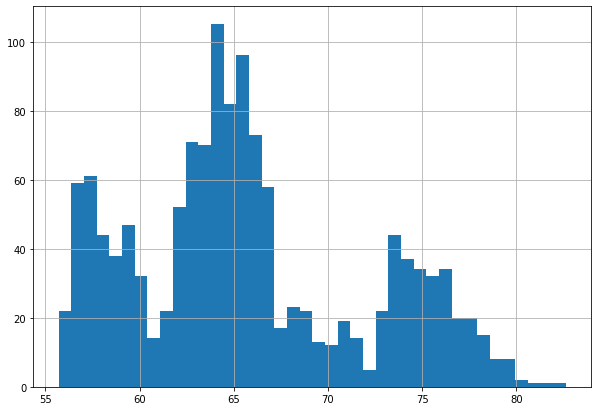

In [60]:
data_for_regression['CLOSE_cur'].hist(bins=40)

Хорошо видны основные важные уровни цены 57, 65, и 75.

Посмотрим на распределения и зависимости остальных переменных.

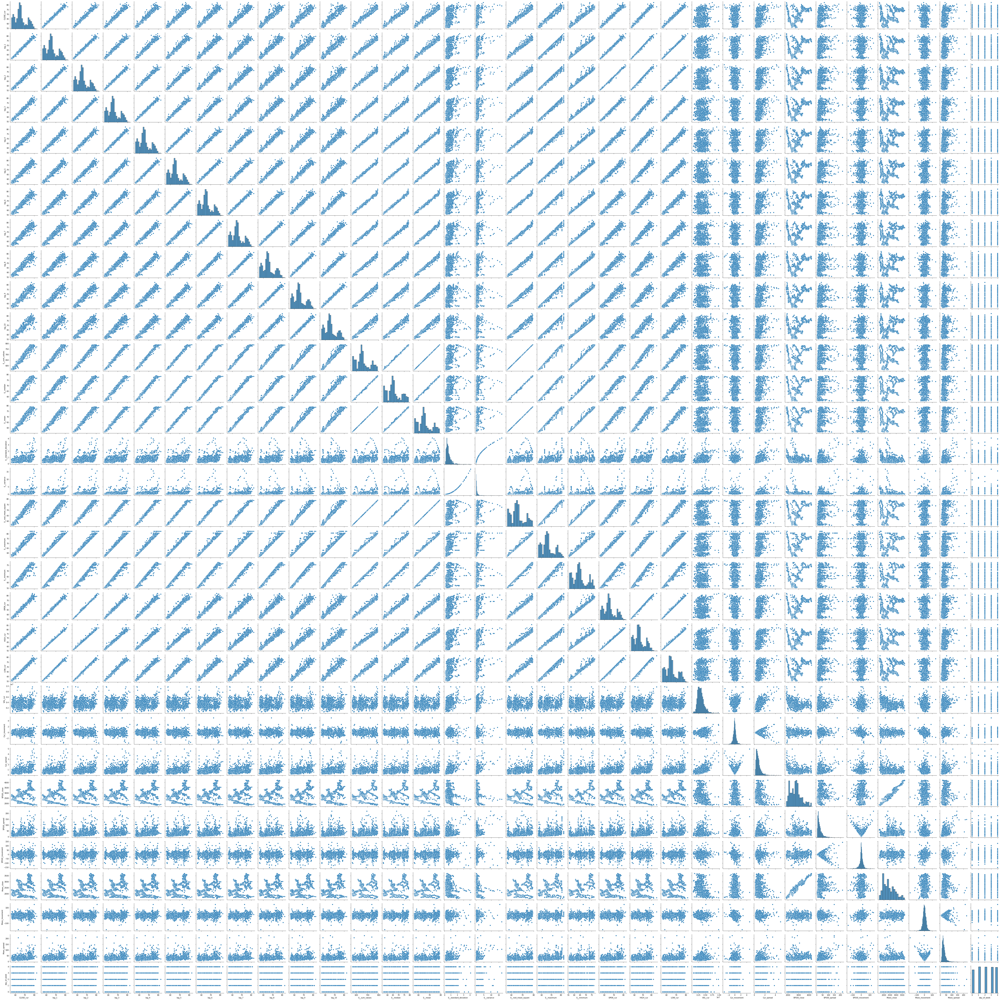

In [61]:
import seaborn as sns

sns.pairplot(data_for_regression)

<AxesSubplot:>

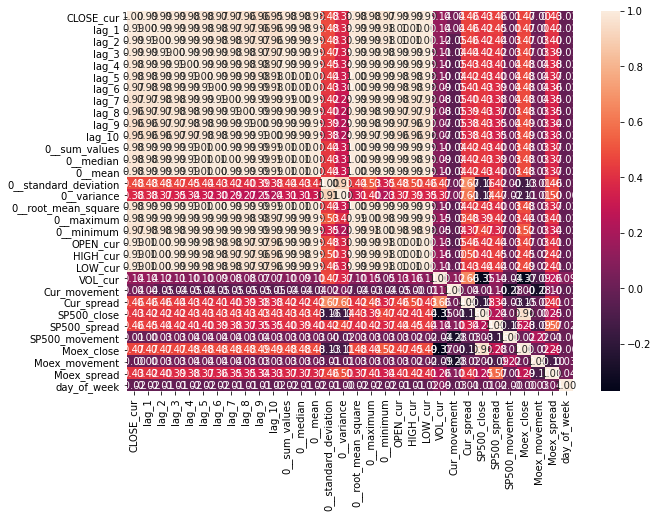

In [62]:
Corr = data_for_regression.corr()
sns.heatmap(Corr, annot=True, fmt='.2f')

Видно, что данные сильно закоррелированы, это и ожидалось - очень много признаков добавлено и сгенерировано из тех же самых данных.

Проверим на наличие пропусков.

In [63]:
data_for_regression.isnull().sum()

DATE                     0
CLOSE_cur                0
lag_1                    0
lag_2                    0
lag_3                    0
lag_4                    0
lag_5                    0
lag_6                    0
lag_7                    0
lag_8                    0
lag_9                    0
lag_10                   0
0__sum_values            0
0__median                0
0__mean                  0
0__standard_deviation    0
0__variance              0
0__root_mean_square      0
0__maximum               0
0__minimum               0
OPEN_cur                 0
HIGH_cur                 0
LOW_cur                  0
VOL_cur                  0
Cur_movement             0
Cur_spread               0
SP500_close              0
SP500_spread             0
SP500_movement           0
Moex_close               0
Moex_movement            0
Moex_spread              0
day_of_week              0
dtype: int64

Сделаем дату индексом.

In [64]:
data_for_regression = data_for_regression.set_index('DATE')
data_for_regression

,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,...,VOL_cur,Cur_movement,Cur_spread,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,day_of_week
DATE,,,,,,,,,,,,,,,,,,,,,
2015-10-19,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,...,4733982.0,0.3400,1.1830,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,0
2015-10-20,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,4354840.0,0.9630,1.2770,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,1
2015-10-21,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,4652025.0,-0.2880,0.7430,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,2
2015-10-22,62.591,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,5589670.0,0.7600,1.1110,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,3
2015-10-23,62.380,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,...,4434848.0,-0.2900,0.6140,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-05,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,...,2215219.0,-0.3250,0.6625,4164.660156,50.450195,-14.379883,3577.209961,19.589844,38.609863,2
2021-05-06,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,...,1661977.0,0.0375,0.4150,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,3
2021-05-07,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,...,2187468.0,-0.6100,0.7000,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,4


In [65]:
# Сделали OHE для категориальной переменной
tabl_day_of_week = pd.get_dummies(data_for_regression['day_of_week'], drop_first=True, prefix='day_of_week')

# Объединили назад наши таблички
data_for_regression = pd.concat([data_for_regression.drop('day_of_week', axis=1), tabl_day_of_week], axis=1)
data_for_regression

,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,...,SP500_close,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4
DATE,,,,,,,,,,,,,,,,,,,,,
2015-10-19,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,...,2033.109985,13.080078,8.739990,1717.000000,-14.900024,31.010010,0,0,0,0
2015-10-20,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,2033.660034,12.139893,1.930054,1716.079956,-1.010010,20.069946,1,0,0,0
2015-10-21,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,2030.770020,12.510010,-2.359985,1722.619995,6.469971,20.199951,0,1,0,0
2015-10-22,62.591,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,2018.939941,20.750000,-14.530029,1709.939941,-12.760010,20.660034,0,0,1,0
2015-10-23,62.380,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,...,2052.510010,33.319946,30.630005,1712.099976,2.169922,15.989990,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-05,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,...,4164.660156,50.450195,-14.379883,3577.209961,19.589844,38.609863,0,1,0,0
2021-05-06,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,...,4167.589844,26.780273,-9.470215,3643.560059,41.390137,43.270020,0,0,1,0
2021-05-07,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,...,4201.620117,55.370117,32.479980,3658.270020,21.560059,26.830078,0,0,0,1


## Подбор моделей

In [66]:
from sklearn.linear_model import LinearRegression

# Подгружаем библиотеки для разбиения на фолды для кроссвалидации
from sklearn.model_selection import cross_val_score, TimeSeriesSplit

# Задаем 5 фолдов для временных рядов 
tscv = TimeSeriesSplit(n_splits=5)

In [67]:
def timeseries_train_test_split(X, y, test_size):
    
    # Разделение тренировочной и тестовой выборки сохраняя структуру временных рядов.
    
    # Получение индекса после которого начинается тестовая выборка.
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index-1]
    y_train = y.iloc[:test_index-1]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

In [68]:
y = data_for_regression.dropna().CLOSE_cur
X = data_for_regression.dropna().drop(['CLOSE_cur'], axis=1)

# Резервируем 30% на тестовую выборку
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [69]:
from sklearn.preprocessing import StandardScaler

# Нормируем данные
# объявили скалировщик!
scaler = StandardScaler()

# учим скалировщик скалировать все переменны на трэйне
scaler.fit(X_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance', '0__root_mean_square',
                    '0__maximum', '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']])

# Применяем скалировщик к трэйну
df_train_scale = scaler.transform(X_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance',
                                           '0__root_mean_square', '0__maximum', '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']])

# Применяем скалирвощик к тесту
df_test_scale = scaler.transform(X_test[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance',
                                         '0__root_mean_square', '0__maximum', '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']])

# Заменяем значения на отскалированные
X_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance', '0__root_mean_square', '0__maximum',
         '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']] = df_train_scale
X_test[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance', '0__root_mean_square', '0__maximum',
        '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_movement', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']] = df_test_scale

### Линейная регрессия

In [70]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [71]:
%matplotlib inline

from sklearn import metrics  # подгружаем метрики


In [72]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [73]:
def print_metrics(y_test,y_pred):
    print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('R2:',  metrics.r2_score(y_test, y_pred))
    print('MAPE:', mean_absolute_percentage_error(y_test, y_pred))
    pass

Смотрим на прогноз модели.

In [74]:
pred_lr = lr.predict(X_test)
print_metrics(y_test, pred_lr)

MAE: 0.4831219261101709
RMSE: 0.6728854959614773
R2: 0.9843852900660907
MAPE: 0.6659679991048237


Объявляем функции для визуализации

In [75]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);
    
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

Смотрим, что получилось

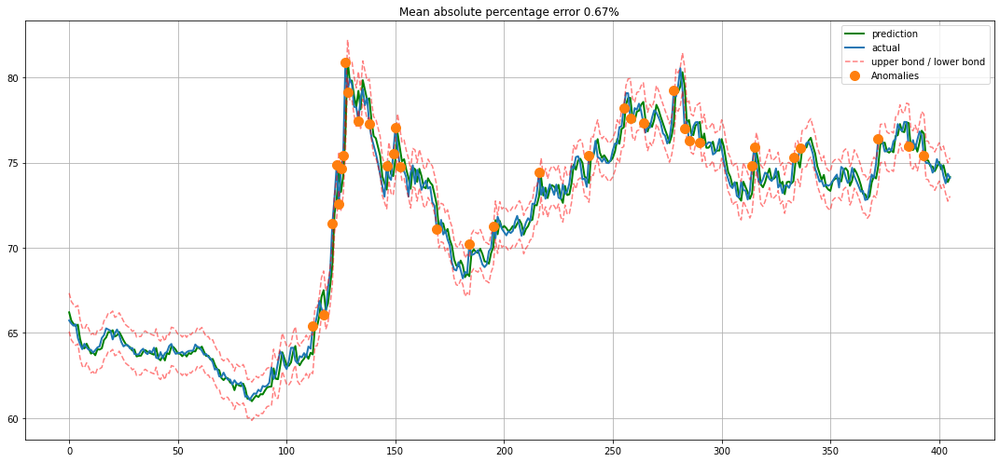

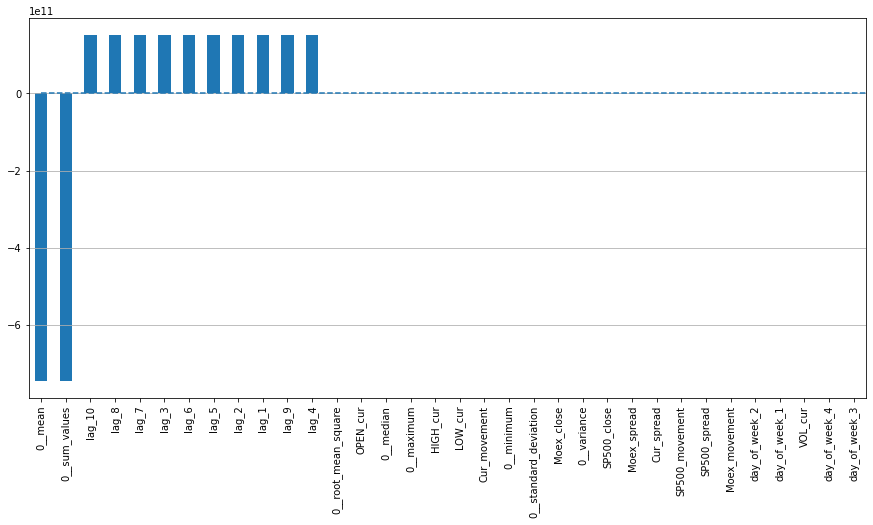

In [76]:
plotModelResults(lr, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lr)

### Ridge и Lasso регрессии

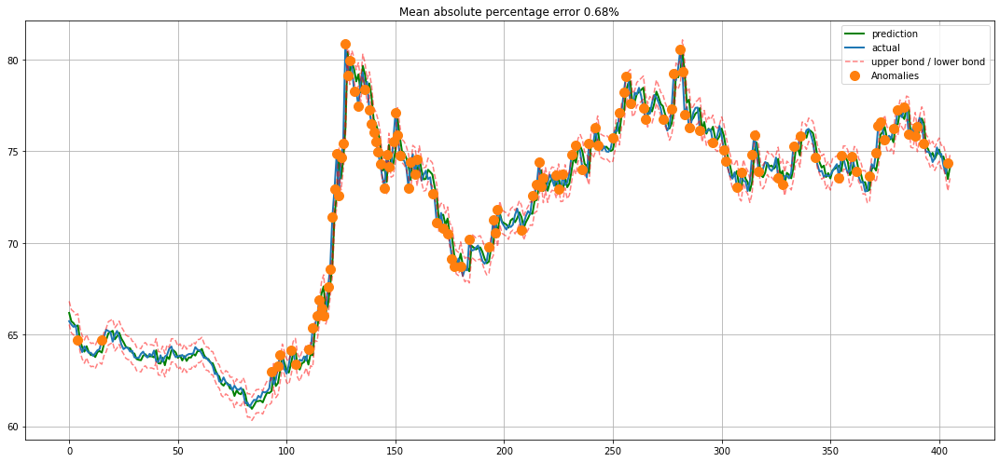

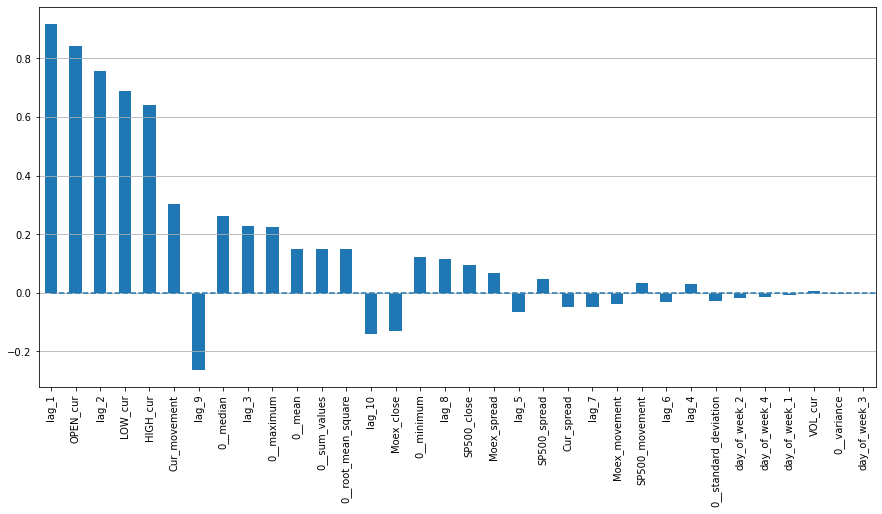

In [77]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv, alphas=np.linspace(5, 10))
ridge.fit(X_train, y_train)

plotModelResults(ridge, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

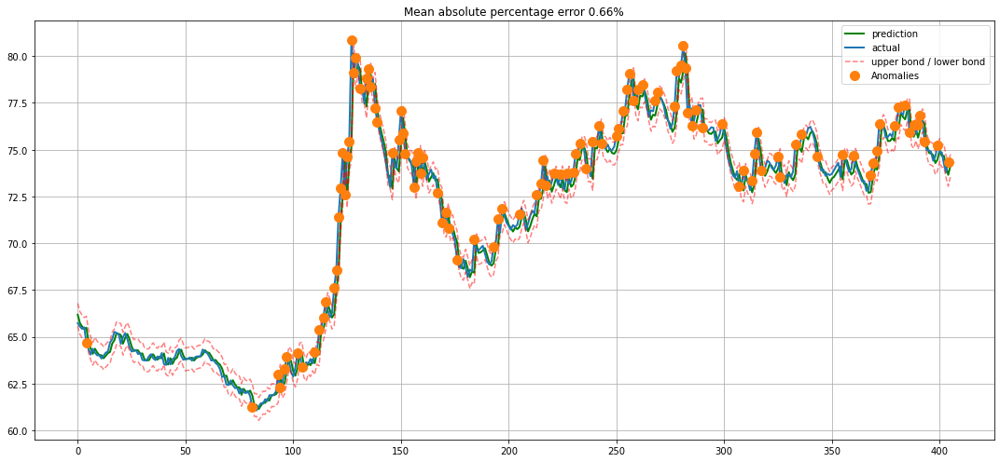

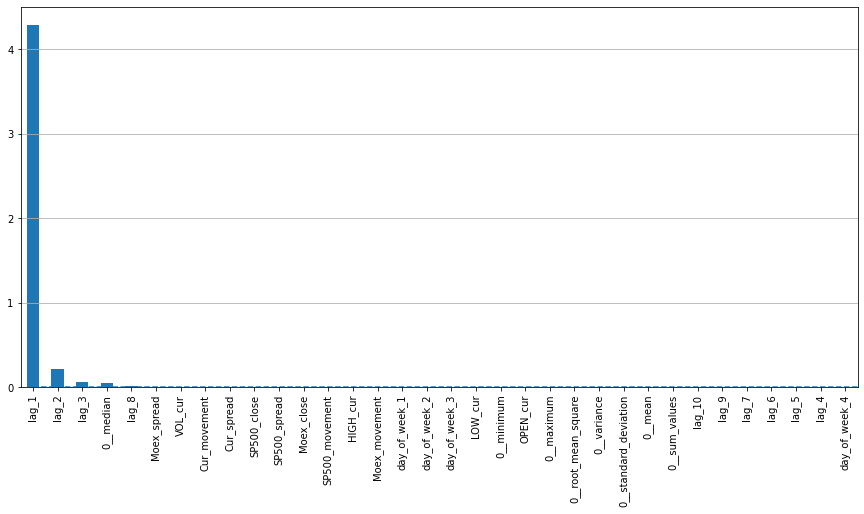

In [78]:
lasso = LassoCV(cv=tscv, eps=0.01)
lasso.fit(X_train, y_train)

plotModelResults(lasso, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

In [79]:
pred_lasso = lasso.predict(X_test)
print_metrics(y_test, pred_lasso)

MAE: 0.47701411185552356
RMSE: 0.7059802479430592
R2: 0.9828115510947727
MAPE: 0.6546787548755416


### AdaBoostRegressor

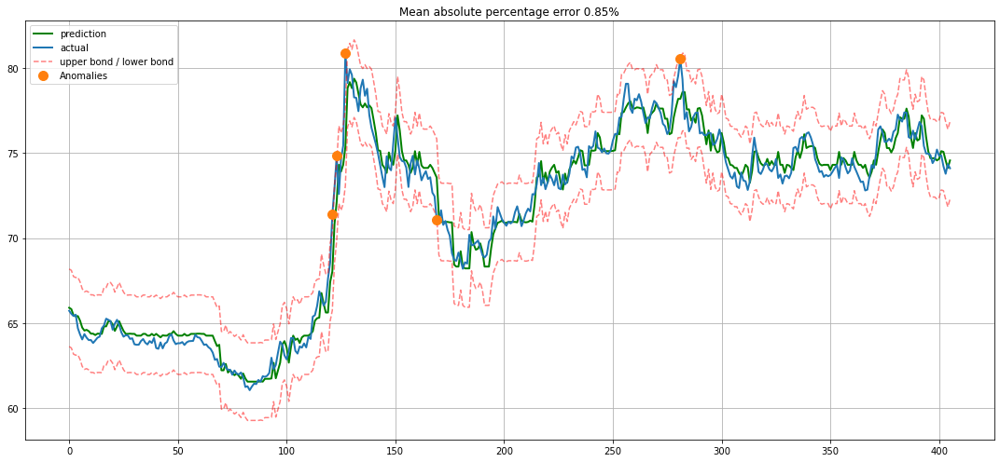

In [80]:
from sklearn.ensemble import AdaBoostRegressor

gbr = AdaBoostRegressor(n_estimators=100)
gbr.fit(X_train, y_train)

plotModelResults(gbr, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)

### XGBoost регрессор

In [81]:
import xgboost as xgb

In [82]:
# Объявляем модель

xgb_r = xgb.XGBRegressor(
    learning_rate=0.5,
    max_depth=5,
    n_estimators=50,
    objective="reg:linear"
)

In [83]:
# Фитим модель
xgb_r.fit(X_train, y_train)

[18:02:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.5, max_delta_step=0, max_depth=5,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=50, n_jobs=4, num_parallel_tree=1,
             objective='reg:linear', random_state=0, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [84]:
pred = xgb_r.predict(X_test)

In [85]:
print_metrics(y_test, pred)

MAE: 0.8163212100625622
RMSE: 1.0946810801313067
R2: 0.9586736727241042
MAPE: 1.119078101254434


[18:02:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:02:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:02:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:02:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[18:02:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


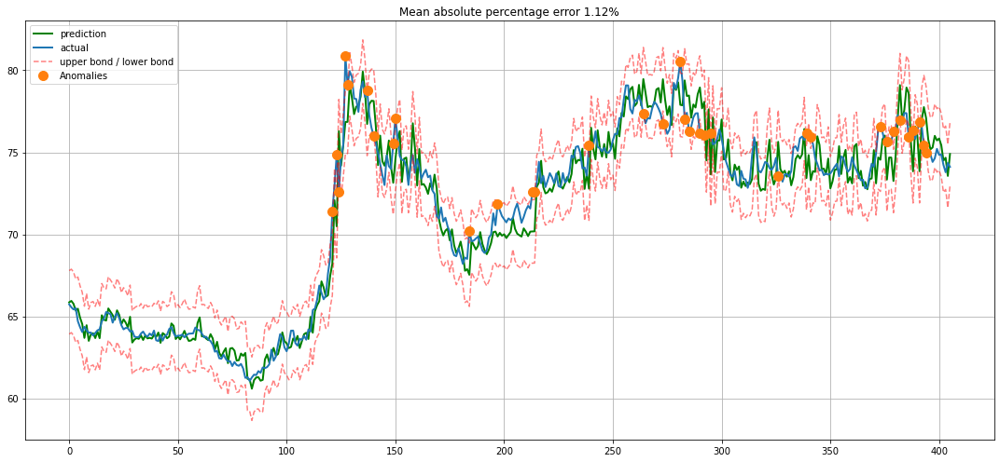

In [86]:
plotModelResults(xgb_r, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)

Попробуем убрать лишние признаки и снова прогоним через модели

In [87]:
data_for_regression_mini = data_for_regression[['CLOSE_cur', 'lag_1', 'lag_2', 'lag_3', '0__median']]
data_for_regression_mini

,CLOSE_cur,lag_1,lag_2,lag_3,0__median
DATE,,,,,
2015-10-19,62.262,61.2850,61.4030,62.7090,62.46950
2015-10-20,62.115,62.2620,61.2850,61.4030,62.26850
2015-10-21,63.005,62.1150,62.2620,61.2850,62.18850
2015-10-22,62.591,63.0050,62.1150,62.2620,62.18850
2015-10-23,62.380,62.5910,63.0050,62.1150,62.26850
...,...,...,...,...,...
2021-05-05,74.860,74.8425,75.2100,74.6350,74.97500
2021-05-06,74.230,74.8600,74.8425,75.2100,74.93000
2021-05-07,73.785,74.2300,74.8600,74.8425,74.87500


In [88]:
y = data_for_regression_mini.dropna().CLOSE_cur
X = data_for_regression_mini.dropna().drop(['CLOSE_cur'], axis=1)

# Резервируем 30% для тестовой выборки
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [89]:
# Нормируем данные
# объявили скалировщик!
scaler = StandardScaler()

# учим скалировщик скалировать все переменны на трэйне
scaler.fit(X_train[['lag_1', 'lag_2', 'lag_3', '0__median']])

# Применяем скалировщик к трэйну
df_train_scale = scaler.transform(X_train[['lag_1', 'lag_2', 'lag_3', '0__median']])

# Применяем скалирвощик к тесту
df_test_scale = scaler.transform(X_test[['lag_1', 'lag_2', 'lag_3', '0__median']])

# Заменяем значения на отскалированные
X_train[['lag_1', 'lag_2', 'lag_3', '0__median']] = df_train_scale
X_test[['lag_1', 'lag_2', 'lag_3', '0__median']] = df_test_scale

### Lasso регрессия

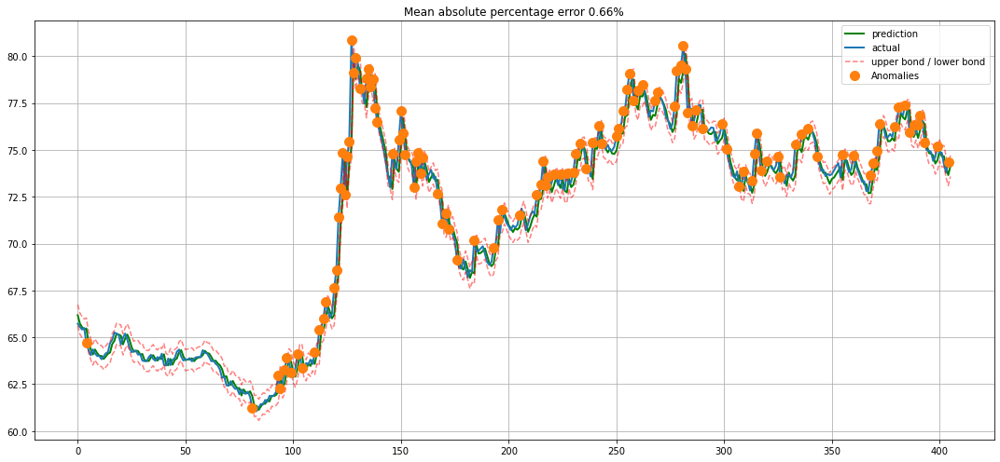

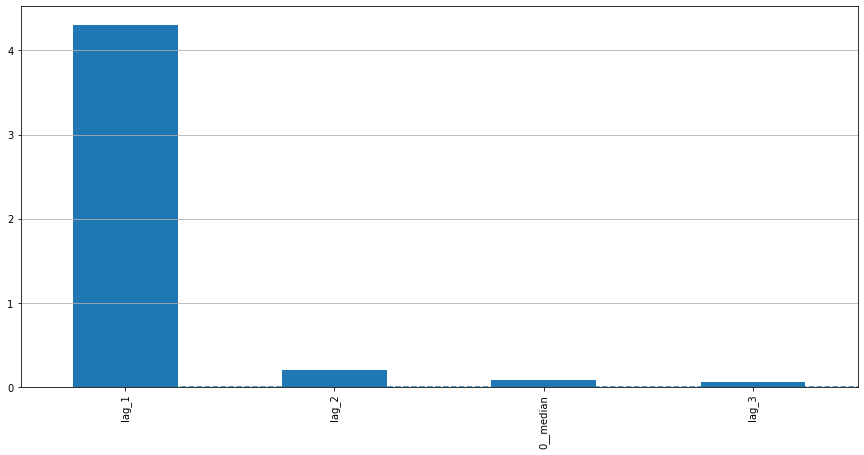

In [90]:
lasso = LassoCV(cv=tscv, eps=0.01)
lasso.fit(X_train, y_train)

plotModelResults(lasso, 
                 X_train=X_train, 
                 X_test=X_test, 
                 plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

In [91]:
pred_lasso = lasso.predict(X_test)
print_metrics(y_test, pred_lasso)

MAE: 0.47774503909656135
RMSE: 0.7085139421979761
R2: 0.9826879543703243
MAPE: 0.6556034854487734


### Линейная регрессия

In [92]:
lr = LinearRegression()
lr.fit(X_train, y_train)

pred_lr = lr.predict(X_test)
print_metrics(y_test, pred_lr)

MAE: 0.4706340225264551
RMSE: 0.6945433341237602
R2: 0.9833639475220862
MAPE: 0.6468309818616702


Предварительно, точность предсказания на один день вперед не достаточная.

Проверим на сколько в среднем изменялась цена доллара за ежедневно.

In [93]:
data_for_regression[['Cur_movement']].abs().mean()

Cur_movement    0.393707
dtype: float64

Действительно, прогноз плохой. Ошибка больше чем изменение цены валюты за день.

Возможно модели правильно прогнозируют направление движения цены.

Проверим.

Вытащим в датафрейм прогнозы линейной регрессии.

In [94]:
pred_linereg = pd.DataFrame(pred_lr)
pred_linereg

,0
0,66.212607
1,65.763850
2,65.577761
3,65.442878
4,65.503374
...,...
401,74.780195
402,74.785098
403,74.205829
404,73.771257


In [95]:
pred_linereg.columns = ['prediction']
pred_linereg

,prediction
0,66.212607
1,65.763850
2,65.577761
3,65.442878
4,65.503374
...,...
401,74.780195
402,74.785098
403,74.205829
404,73.771257


In [96]:
pred_linereg['num'] = range(0, 406)
pred_linereg

,prediction,num
0,66.212607,0
1,65.763850,1
2,65.577761,2
3,65.442878,3
4,65.503374,4
...,...,...
401,74.780195,401
402,74.785098,402
403,74.205829,403
404,73.771257,404


In [97]:
check_data = pd.DataFrame(y_test)
check_data

,CLOSE_cur
DATE,
2019-09-06,65.730
2019-09-09,65.550
2019-09-10,65.420
2019-09-11,65.500
2019-09-12,64.700
...,...
2021-05-05,74.860
2021-05-06,74.230
2021-05-07,73.785


In [98]:
check_data['num'] = range(0, 406)
check_data

,CLOSE_cur,num
DATE,,
2019-09-06,65.730,0
2019-09-09,65.550,1
2019-09-10,65.420,2
2019-09-11,65.500,3
2019-09-12,64.700,4
...,...,...
2021-05-05,74.860,401
2021-05-06,74.230,402
2021-05-07,73.785,403


Объединили в один датафрейм реальные данные и прогнозные

In [99]:
check_data = check_data.merge(pred_linereg, on='num', how='inner')
check_data

,CLOSE_cur,num,prediction
0,65.730,0,66.212607
1,65.550,1,65.763850
2,65.420,2,65.577761
3,65.500,3,65.442878
4,64.700,4,65.503374
...,...,...,...
401,74.860,401,74.780195
402,74.230,402,74.785098
403,73.785,403,74.205829
404,74.350,404,73.771257


In [100]:
check_data = check_data.drop(['num'], axis=1)
check_data

,CLOSE_cur,prediction
0,65.730,66.212607
1,65.550,65.763850
2,65.420,65.577761
3,65.500,65.442878
4,64.700,65.503374
...,...,...
401,74.860,74.780195
402,74.230,74.785098
403,73.785,74.205829
404,74.350,73.771257


Следующим шагом необходимо расчитать каким было движение цены валюты: положительным или отрицательным.

Для расчета реального изменения цены: цена закрытия  - цена закрытия прошлого дня.
    
Для расчета прогноза: прогнозная цена  - цена закрытия прошлого дня.

In [101]:
check_data['real_moving'] = None

for i in range(1,406):
    check_data['real_moving'][i] = check_data['CLOSE_cur'][i] - check_data['CLOSE_cur'][i-1]

check_data

,CLOSE_cur,prediction,real_moving
0,65.730,66.212607,None
1,65.550,65.763850,-0.18
2,65.420,65.577761,-0.13
3,65.500,65.442878,0.08
4,64.700,65.503374,-0.8
...,...,...,...
401,74.860,74.780195,0.0175
402,74.230,74.785098,-0.63
403,73.785,74.205829,-0.445
404,74.350,73.771257,0.565


In [102]:
check_data['prediction_range'] = None

for i in range(1,406):
    check_data['prediction_range'][i] = check_data['prediction'][i] - check_data['CLOSE_cur'][i-1]

check_data

,CLOSE_cur,prediction,real_moving,prediction_range
0,65.730,66.212607,None,None
1,65.550,65.763850,-0.18,0.0338504
2,65.420,65.577761,-0.13,0.0277615
3,65.500,65.442878,0.08,0.0228775
4,64.700,65.503374,-0.8,0.00337392
...,...,...,...,...
401,74.860,74.780195,0.0175,-0.0623045
402,74.230,74.785098,-0.63,-0.0749023
403,73.785,74.205829,-0.445,-0.0241713
404,74.350,73.771257,0.565,-0.0137428


In [103]:
check_data = check_data.dropna()
check_data

,CLOSE_cur,prediction,real_moving,prediction_range
1,65.5500,65.763850,-0.18,0.0338504
2,65.4200,65.577761,-0.13,0.0277615
3,65.5000,65.442878,0.08,0.0228775
4,64.7000,65.503374,-0.8,0.00337392
5,64.3375,64.769991,-0.3625,0.0699914
...,...,...,...,...
401,74.8600,74.780195,0.0175,-0.0623045
402,74.2300,74.785098,-0.63,-0.0749023
403,73.7850,74.205829,-0.445,-0.0241713
404,74.3500,73.771257,0.565,-0.0137428


In [104]:
check_data['real_moving'] = check_data['real_moving'].astype(float)
check_data['prediction_range'] = check_data['prediction_range'].astype(float)
check_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 405 entries, 1 to 405
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   CLOSE_cur         405 non-null    float64
 1   prediction        405 non-null    float64
 2   real_moving       405 non-null    float64
 3   prediction_range  405 non-null    float64
dtypes: float64(4)
memory usage: 15.8 KB


Добавим столбец, куда будем записывать результат срвнения прогноза и реального изменения.

In [105]:
check_data['result'] = None
check_data

,CLOSE_cur,prediction,real_moving,prediction_range,result
1,65.5500,65.763850,-0.1800,0.033850,None
2,65.4200,65.577761,-0.1300,0.027761,None
3,65.5000,65.442878,0.0800,0.022878,None
4,64.7000,65.503374,-0.8000,0.003374,None
5,64.3375,64.769991,-0.3625,0.069991,None
...,...,...,...,...,...
401,74.8600,74.780195,0.0175,-0.062305,None
402,74.2300,74.785098,-0.6300,-0.074902,None
403,73.7850,74.205829,-0.4450,-0.024171,None
404,74.3500,73.771257,0.5650,-0.013743,None


Пройдем циклом и если направление прогноза и реального изменения цены совпадает ставим 1, если нет - 0.

In [106]:
for i in range(1,406):
    if check_data['real_moving'][i] > 0 and check_data['prediction_range'][i] > 0:
        check_data['result'][i] = 1
    elif check_data['real_moving'][i] < 0 and check_data['prediction_range'][i] < 0:
        check_data['result'][i] = 1
    else: 
        check_data['result'][i] = 0
        
            

check_data

,CLOSE_cur,prediction,real_moving,prediction_range,result
1,65.5500,65.763850,-0.1800,0.033850,0
2,65.4200,65.577761,-0.1300,0.027761,0
3,65.5000,65.442878,0.0800,0.022878,1
4,64.7000,65.503374,-0.8000,0.003374,0
5,64.3375,64.769991,-0.3625,0.069991,0
...,...,...,...,...,...
401,74.8600,74.780195,0.0175,-0.062305,0
402,74.2300,74.785098,-0.6300,-0.074902,1
403,73.7850,74.205829,-0.4450,-0.024171,1
404,74.3500,73.771257,0.5650,-0.013743,0


Посчитаем сколько единиц и нулей.

In [107]:
check_data['result'].value_counts()

1    209
0    196
Name: result, dtype: int64

Правильных прогнозов почти столько же, сколько и ошибочных. Модель не имеет прогнозной ценности.

Попробуем подобрать модели классификации. Для этого создадим целевой признак: 1 - цена росла, 0 - цена снижалась.

In [108]:
data_for_classification = data_for_regression.copy()

def up_or_down(row):
    if row['Cur_movement']>0:
        return 1
    else:
        return 0

    
data_for_classification['Cur_movement_up_or_down'] = data_for_classification.apply(up_or_down, axis=1)
data_for_classification

,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,...,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,Cur_movement_up_or_down
DATE,,,,,,,,,,,,,,,,,,,,,
2015-10-19,62.262,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,...,13.080078,8.739990,1717.000000,-14.900024,31.010010,0,0,0,0,1
2015-10-20,62.115,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,12.139893,1.930054,1716.079956,-1.010010,20.069946,1,0,0,0,1
2015-10-21,63.005,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,12.510010,-2.359985,1722.619995,6.469971,20.199951,0,1,0,0,0
2015-10-22,62.591,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,20.750000,-14.530029,1709.939941,-12.760010,20.660034,0,0,1,0,1
2015-10-23,62.380,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,...,33.319946,30.630005,1712.099976,2.169922,15.989990,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-05,74.860,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,...,50.450195,-14.379883,3577.209961,19.589844,38.609863,0,1,0,0,0
2021-05-06,74.230,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,...,26.780273,-9.470215,3643.560059,41.390137,43.270020,0,0,1,0,1
2021-05-07,73.785,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,...,55.370117,32.479980,3658.270020,21.560059,26.830078,0,0,0,1,0


In [109]:
data_for_classification[['Cur_movement_up_or_down', 'Cur_movement','CLOSE_cur']]

,Cur_movement_up_or_down,Cur_movement,CLOSE_cur
DATE,,,
2015-10-19,1,0.3400,62.262
2015-10-20,1,0.9630,62.115
2015-10-21,0,-0.2880,63.005
2015-10-22,1,0.7600,62.591
2015-10-23,0,-0.2900,62.380
...,...,...,...
2021-05-05,0,-0.3250,74.860
2021-05-06,1,0.0375,74.230
2021-05-07,0,-0.6100,73.785


Т.к. ранее 'Cur_movement' был признаком вчерашнего дня для прогнозирования текущего, необходимо целевую переменную сдвинуть так, чтобы она стала актуальной.

In [110]:
data_for_classification['Cur_movement_up_or_down_shift'] = data_for_classification.Cur_movement_up_or_down.shift(-1)
data_for_classification[['Cur_movement_up_or_down', 'Cur_movement_up_or_down_shift', 'Cur_movement','CLOSE_cur']]

,Cur_movement_up_or_down,Cur_movement_up_or_down_shift,Cur_movement,CLOSE_cur
DATE,,,,
2015-10-19,1,1.0,0.3400,62.262
2015-10-20,1,0.0,0.9630,62.115
2015-10-21,0,1.0,-0.2880,63.005
2015-10-22,1,0.0,0.7600,62.591
2015-10-23,0,0.0,-0.2900,62.380
...,...,...,...,...
2021-05-05,0,1.0,-0.3250,74.860
2021-05-06,1,0.0,0.0375,74.230
2021-05-07,0,0.0,-0.6100,73.785


In [111]:
data_for_classification = data_for_classification.dropna()
data_for_classification

,CLOSE_cur,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,...,SP500_movement,Moex_close,Moex_movement,Moex_spread,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,Cur_movement_up_or_down,Cur_movement_up_or_down_shift
DATE,,,,,,,,,,,,,,,,,,,,,
2015-10-19,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,...,8.739990,1717.000000,-14.900024,31.010010,0,0,0,0,1,1.0
2015-10-20,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,1.930054,1716.079956,-1.010010,20.069946,1,0,0,0,1,0.0
2015-10-21,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,-2.359985,1722.619995,6.469971,20.199951,0,1,0,0,0,1.0
2015-10-22,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,-14.530029,1709.939941,-12.760010,20.660034,0,0,1,0,1,0.0
2015-10-23,62.3800,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,...,30.630005,1712.099976,2.169922,15.989990,0,0,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-04,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,76.8300,...,-16.930176,3544.000000,-30.030029,48.109863,1,0,0,0,1,0.0
2021-05-05,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,...,-14.379883,3577.209961,19.589844,38.609863,0,1,0,0,0,1.0
2021-05-06,74.2300,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,...,-9.470215,3643.560059,41.390137,43.270020,0,0,1,0,1,0.0


In [112]:
data_for_classification = data_for_classification.drop(['Cur_movement_up_or_down', 'CLOSE_cur', 'Cur_movement'], axis=1)
data_for_classification


,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,...,SP500_spread,SP500_movement,Moex_close,Moex_movement,Moex_spread,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,Cur_movement_up_or_down_shift
DATE,,,,,,,,,,,,,,,,,,,,,
2015-10-19,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,64.7490,...,13.080078,8.739990,1717.000000,-14.900024,31.010010,0,0,0,0,1.0
2015-10-20,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,63.3300,...,12.139893,1.930054,1716.079956,-1.010010,20.069946,1,0,0,0,0.0
2015-10-21,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,62.6640,...,12.510010,-2.359985,1722.619995,6.469971,20.199951,0,1,0,0,1.0
2015-10-22,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,61.3700,...,20.750000,-14.530029,1709.939941,-12.760010,20.660034,0,0,1,0,0.0
2015-10-23,62.5910,63.0050,62.1150,62.2620,61.2850,61.4030,62.7090,63.0390,62.2750,61.8760,...,33.319946,30.630005,1712.099976,2.169922,15.989990,0,0,0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-04,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,76.8300,76.3500,...,23.250000,-16.930176,3544.000000,-30.030029,48.109863,1,0,0,0,0.0
2021-05-05,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,76.8300,...,50.450195,-14.379883,3577.209961,19.589844,38.609863,0,1,0,0,1.0
2021-05-06,74.8600,74.8425,75.2100,74.6350,74.4125,74.8900,74.9700,74.9800,75.4175,76.6000,...,26.780273,-9.470215,3643.560059,41.390137,43.270020,0,0,1,0,0.0


In [113]:
from sklearn.model_selection import train_test_split

# Разбиваем на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(
    data_for_classification.drop(['Cur_movement_up_or_down_shift'], axis=1), 
    data_for_classification['Cur_movement_up_or_down_shift'], 
    test_size=0.30, 
    random_state=42
)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((944, 33), (405, 33), (944,), (405,))

In [114]:
# Нормируем данные
# объявили скалировщик!
scaler = StandardScaler()

# учим скалировщик скалировать все переменны на трэйне
scaler.fit(X_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance', '0__root_mean_square',
                    '0__maximum', '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']])

# Применяем скалировщик к трэйну
df_train_scale = scaler.transform(X_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance',
                                           '0__root_mean_square', '0__maximum', '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']])

# Применяем скалирвощик к тесту
df_test_scale = scaler.transform(X_test[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance',
                                         '0__root_mean_square', '0__maximum', '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']])

# Заменяем значения на отскалированные
X_train[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance', '0__root_mean_square', '0__maximum',
         '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']] = df_train_scale
X_test[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'lag_8', 'lag_9', 'lag_10', '0__sum_values', '0__median', '0__mean', '0__standard_deviation', '0__variance', '0__root_mean_square', '0__maximum',
        '0__minimum', 'OPEN_cur', 'HIGH_cur', 'LOW_cur', 'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement', 'Moex_close', 'Moex_movement', 'Moex_spread']] = df_test_scale

### Логистическая регрессия

In [115]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression()

log_reg.fit(X_train, y_train)

y_pred_logres = log_reg.predict(X_test)

In [116]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_logres))

              precision    recall  f1-score   support

         0.0       0.56      0.58      0.57       222
         1.0       0.47      0.45      0.46       183

    accuracy                           0.52       405
   macro avg       0.52      0.52      0.52       405
weighted avg       0.52      0.52      0.52       405



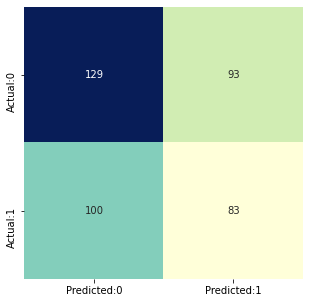

In [117]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred_logres)

conf_matrix = pd.DataFrame(data = cm, columns = ['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

### XGBoost

In [118]:
# Объявляем модель
xgb_c = xgb.XGBClassifier(
    learning_rate=0.001,
    max_depth=6,
    n_estimators=200,
    random_state=42,
    n_jobs=2
)

In [119]:
# Фитим
xgb_c.fit(X_train, y_train)

[18:02:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.001, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=2, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [120]:
# Предсказываем
pred_xgb_c = xgb_c.predict(X_test)

In [121]:
print(classification_report(y_test, pred_xgb_c))

              precision    recall  f1-score   support

         0.0       0.58      0.84      0.68       222
         1.0       0.57      0.26      0.35       183

    accuracy                           0.58       405
   macro avg       0.57      0.55      0.52       405
weighted avg       0.57      0.58      0.53       405



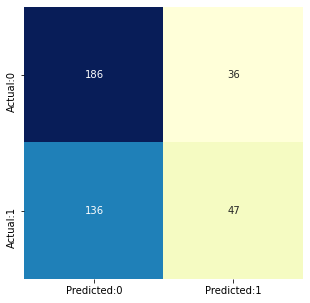

In [122]:
cm = confusion_matrix(y_test, pred_xgb_c)

conf_matrix = pd.DataFrame(data = cm, columns = ['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

In [123]:
from xgboost import plot_importance

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

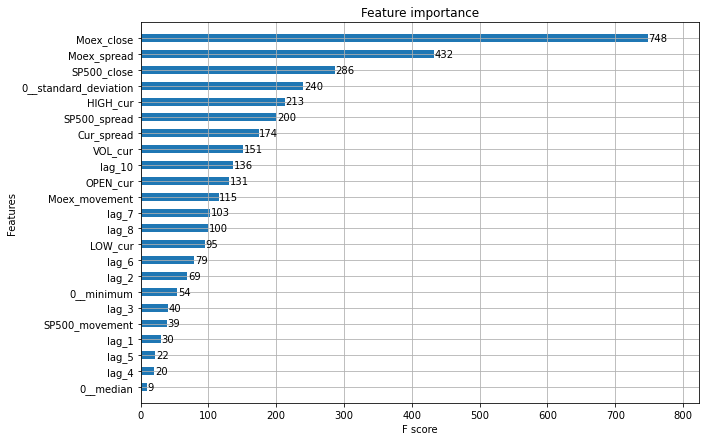

In [124]:
# увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10,7

plot_importance(xgb_c, height=0.5) 

Попробуем лишние признаки убрать и снова прогнать через алгоритмы.

In [125]:
X_train_mini = X_train[['lag_1', 'lag_2', 'lag_3',
                        '0__standard_deviation',
                        'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement',
                        'Moex_close', 'Moex_movement', 'Moex_spread',
                        ]]
X_test_mini = X_test[['lag_1', 'lag_2', 'lag_3', 
                      '0__standard_deviation',
                      'VOL_cur', 'Cur_spread', 'SP500_close', 'SP500_spread', 'SP500_movement',
                      'Moex_close', 'Moex_movement', 'Moex_spread',
                      ]]

In [126]:
# Объявляем модель
xgb_c_mini = xgb.XGBClassifier(
    learning_rate=0.001,
    max_depth=4,
    n_estimators=400,
    random_state=42,
    n_jobs=2
)

In [127]:
# Фитим
xgb_c_mini.fit(X_train_mini, y_train)

[18:02:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.001, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=400, n_jobs=2, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [128]:
# Предсказываем
pred_xgb_c_mini = xgb_c_mini.predict(X_test_mini)

In [129]:
print(classification_report(y_test, pred_xgb_c_mini))

              precision    recall  f1-score   support

         0.0       0.56      0.82      0.67       222
         1.0       0.51      0.22      0.31       183

    accuracy                           0.55       405
   macro avg       0.54      0.52      0.49       405
weighted avg       0.54      0.55      0.51       405



<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

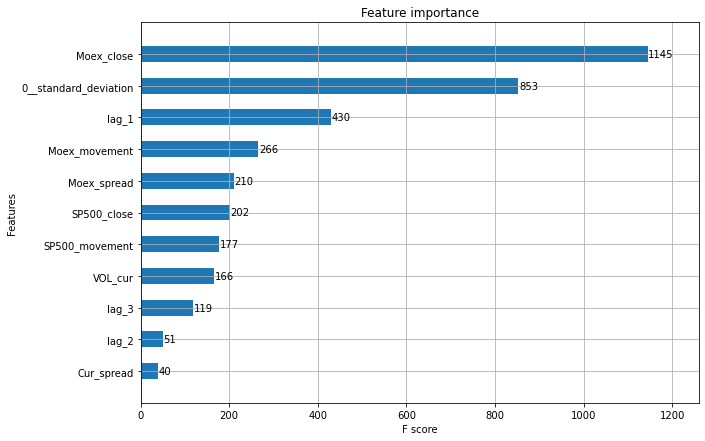

In [130]:
plot_importance(xgb_c_mini, height=0.5) 

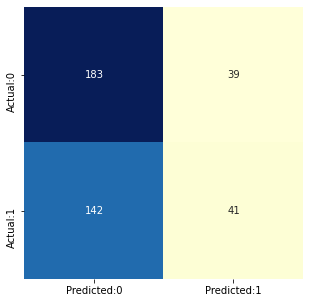

In [131]:
cm = confusion_matrix(y_test, pred_xgb_c_mini)

conf_matrix = pd.DataFrame(data = cm, columns = ['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

# Выводы.

На данном наборе данных регрессионные модели не позволяют делать прогнозы, имеющие практическую ценность. 

Алгоритмы классификации показали себя лучше, но качество предсказания не достаточное для его применения в прогнозировании изменения цены валюты.

### Что можно еще сделать.
* Объединить наиболее показательные признаки с данного и предыдущего проекта.
* Добавить дополнительные признаки.
* Изменить представление временных рядов.
* Дать больше данных на обучение моделей.
* Попробовать прогнозировать на 3-5 дней вперед.
* Попробовать кластеризацию.